In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.compose import ColumnTransformer
from xgboost import XGBRegressor
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.metrics import mean_absolute_error

In [ ]:
df = pd.read_csv("/content/sales_data.csv")

In [ ]:
df.shape

(76000, 16)

# Business Understanding

In [ ]:
df.head(7)

,Date,Store ID,Product ID,Category,Region,Inventory Level,Units Sold,Units Ordered,Price,Discount,Weather Condition,Promotion,Competitor Pricing,Seasonality,Epidemic,Demand
0,2022-01-01,S001,P0001,Electronics,North,195,102,252,72.72,5,Snowy,0,85.73,Winter,0,115
1,2022-01-01,S001,P0002,Clothing,North,117,117,249,80.16,15,Snowy,1,92.02,Winter,0,229
2,2022-01-01,S001,P0003,Clothing,North,247,114,612,62.94,10,Snowy,1,60.08,Winter,0,157
3,2022-01-01,S001,P0004,Electronics,North,139,45,102,87.63,10,Snowy,0,85.19,Winter,0,52
4,2022-01-01,S001,P0005,Groceries,North,152,65,271,54.41,0,Snowy,0,51.63,Winter,0,59
5,2022-01-01,S001,P0006,Toys,North,209,60,0,35.53,0,Snowy,0,40.01,Winter,0,55
6,2022-01-01,S001,P0007,Groceries,North,118,81,335,23.27,5,Snowy,0,24.78,Winter,0,94


Date: Tanggal pencatatan.<br>
Store ID: Pengidentifikasi unik untuk toko.<br>
Product ID: Pengidentifikasi unik untuk produk.<br>
Category: Kategori produk.<br>
Region: Wilayah geografis toko.<br>
Inventory Level: Unit yang tersedia dalam stok.<br>
Units Sold: Unit yang terjual pada hari itu.<br>
Units Ordered: Unit yang dipesan untuk diisi ulang.<br>
Price: Harga produk.<br>
Discount: Diskon yang berlaku, jika ada.<br>
Weather Condition: Cuaca pada hari pencatatan.<br>
Promotion: 1 jika ada promosi, 0 jika tidak.<br>
Competitor Pricing: Harga produk serupa dari pesaing.<br>
Seasonality: Musim (misalnya, Musim Dingin, Musim Semi).<br>
Epidemic: 1 jika terjadi epidemi, 0 jika tidak.<br>
Demand: Estimasi permintaan harian untuk produk tersebut<br>

### Background Project
Penjualan produk retail mengalami fluktuasi yang dipengaruhi oleh berbagai faktor eksternal seperti kondisi cuaca, musim, promosi, dan diskon. Ketidakstabilan ini menyulitkan pihak retailer dalam melakukan perencanaan permintaan (demand forecasting) dan menjaga tingkat persediaan (inventory level) yang optimal di gudang. Oleh karena itu, diperlukan pendekatan analisis dan pemodelan yang dapat memperkirakan kebutuhan stok secara lebih akurat untuk mendukung keputusan bisnis.Kegagalan memprediksi demand dapat menyebabkan overstock atau kehabisan barang, yang berujung pada kerugian bisnis.

### Main Objective/ Goals
Membuat model prediksi permintaan produk retail yang akurat berdasarkan data historis penjualan untuk mendukung pengambilan keputusan dalam pengelolaan stok dan strategi pemasaran.

# Data Understanding

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 76000 entries, 0 to 75999
Data columns (total 16 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Date                76000 non-null  object 
 1   Store ID            76000 non-null  object 
 2   Product ID          76000 non-null  object 
 3   Category            76000 non-null  object 
 4   Region              76000 non-null  object 
 5   Inventory Level     76000 non-null  int64  
 6   Units Sold          76000 non-null  int64  
 7   Units Ordered       76000 non-null  int64  
 8   Price               76000 non-null  float64
 9   Discount            76000 non-null  int64  
 10  Weather Condition   76000 non-null  object 
 11  Promotion           76000 non-null  int64  
 12  Competitor Pricing  76000 non-null  float64
 13  Seasonality         76000 non-null  object 
 14  Epidemic            76000 non-null  int64  
 15  Demand              76000 non-null  int64  
dtypes: f

Terdapat 16 kolom dengan 76000 baris, secara sekilas tidak ada missing value namun akan dicek lebih lanjut. <br>
Kolom date type data nya belum sesuai

In [ ]:
df.describe()

,Inventory Level,Units Sold,Units Ordered,Price,Discount,Promotion,Competitor Pricing,Epidemic,Demand
count,76000.000000,76000.000000,76000.000000,76000.000000,76000.000000,76000.000000,76000.000000,76000.000000,76000.000000
mean,301.062842,88.827316,89.090645,67.726028,9.087039,0.328947,69.454029,0.200000,104.317158
std,226.510161,43.994525,162.404627,39.377899,7.475781,0.469834,40.943818,0.400003,46.964801
min,0.000000,0.000000,0.000000,4.740000,0.000000,0.000000,4.290000,0.000000,4.000000
25%,136.000000,58.000000,0.000000,31.997500,5.000000,0.000000,32.620000,0.000000,71.000000
50%,227.000000,84.000000,0.000000,64.500000,10.000000,0.000000,65.700000,0.000000,100.000000
75%,408.000000,114.000000,121.000000,95.830000,10.000000,1.000000,97.932500,0.000000,133.000000
max,2267.000000,426.000000,1616.000000,228.030000,25.000000,1.000000,261.220000,1.000000,430.000000


Dari data statistik secara ringkas diatas, untuk kolom promotion dan Epidemic hanya berisi 0 dan 1 (ya atau tidak).<br>
Di semua kolom pada nilai terendah(min) tidak ada nilai minus atau dibawah nol namun ada dugaan outlier pada kolom Inventory level dan units ordered karena nilai max nya jauh dari 50% nya, ini akan dicek lebih lanjut tidak hanya 2 kolom tersebut namun kolom lainnya juga menggunakan boxplot.

# Data Preprocessing

## Data Cleaning

### Cek Data Duplicated

In [ ]:
df.duplicated().sum()

np.int64(0)

### Cek Data Missing Value

In [ ]:
df.isnull().sum()

,0
Date,0
Store ID,0
Product ID,0
Category,0
Region,0
Inventory Level,0
Units Sold,0
Units Ordered,0
Price,0
Discount,0


Tidak ada data duplicate dan missing value, namun akan dicek untuk value masing-masing kolom apakah data sudah sesuai atau belum

### Cek Kesesuaian Data setiap Kolom

In [ ]:
df['Category'].unique()

array(['Electronics', 'Clothing', 'Groceries', 'Toys', 'Furniture'],
      dtype=object)

In [ ]:
df.groupby('Category')['Product ID'].nunique()

,Product ID
Category,
Clothing,13
Electronics,10
Furniture,12
Groceries,18
Toys,11


Setiap Category memiliki jumlah product yang berbeda (based on product ID)

In [ ]:
df.groupby('Region')['Store ID'].nunique()

,Store ID
Region,
East,1
North,2
South,1
West,1


Terdapat 4 region, masing-masing terdapat 1 store kecuali region North memiliki 2 store (based on store ID)

In [ ]:
df['Weather Condition'].unique()

array(['Snowy', 'Cloudy', 'Sunny', 'Rainy'], dtype=object)

In [ ]:
df['Seasonality'].unique()

array(['Winter', 'Spring', 'Summer', 'Autumn'], dtype=object)

Nilai di setiap kolom sesuai/tidak ada data yang aneh

### Cek Outlier

In [ ]:
df.describe()

,Inventory Level,Units Sold,Units Ordered,Price,Discount,Promotion,Competitor Pricing,Epidemic,Demand
count,76000.000000,76000.000000,76000.000000,76000.000000,76000.000000,76000.000000,76000.000000,76000.000000,76000.000000
mean,301.062842,88.827316,89.090645,67.726028,9.087039,0.328947,69.454029,0.200000,104.317158
std,226.510161,43.994525,162.404627,39.377899,7.475781,0.469834,40.943818,0.400003,46.964801
min,0.000000,0.000000,0.000000,4.740000,0.000000,0.000000,4.290000,0.000000,4.000000
25%,136.000000,58.000000,0.000000,31.997500,5.000000,0.000000,32.620000,0.000000,71.000000
50%,227.000000,84.000000,0.000000,64.500000,10.000000,0.000000,65.700000,0.000000,100.000000
75%,408.000000,114.000000,121.000000,95.830000,10.000000,1.000000,97.932500,0.000000,133.000000
max,2267.000000,426.000000,1616.000000,228.030000,25.000000,1.000000,261.220000,1.000000,430.000000


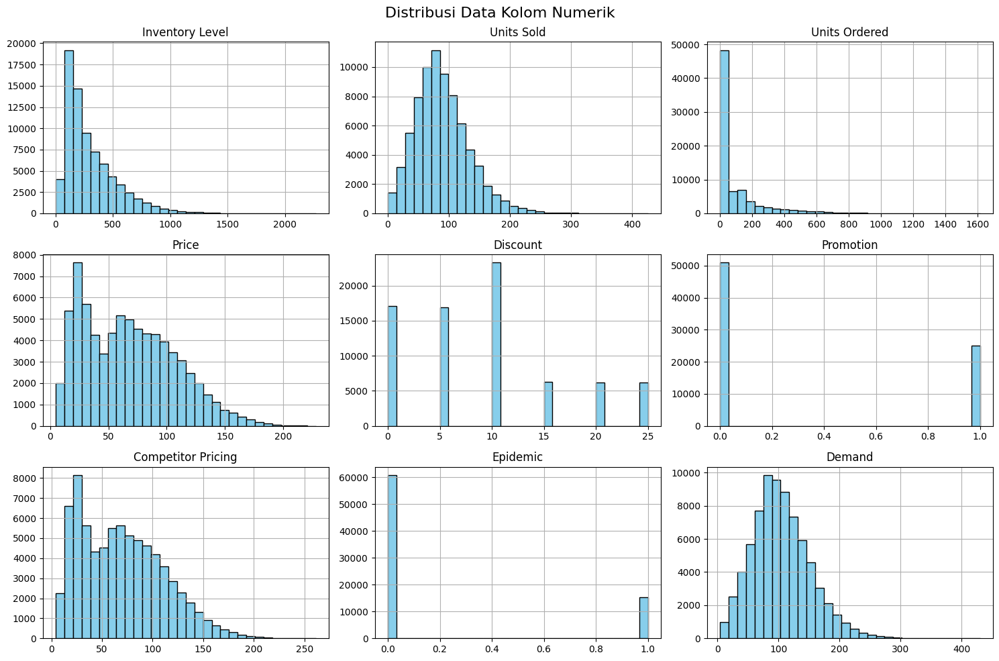

In [ ]:
# melihat distribusi data tiap kolom numerik
kolom_numerik = df.select_dtypes(include='number').columns

# Plot histogram untuk tiap kolom
df[kolom_numerik].hist(figsize=(15, 10), bins=30, color='skyblue', edgecolor='black')
plt.suptitle('Distribusi Data Kolom Numerik', fontsize=16)
plt.tight_layout()
plt.show()

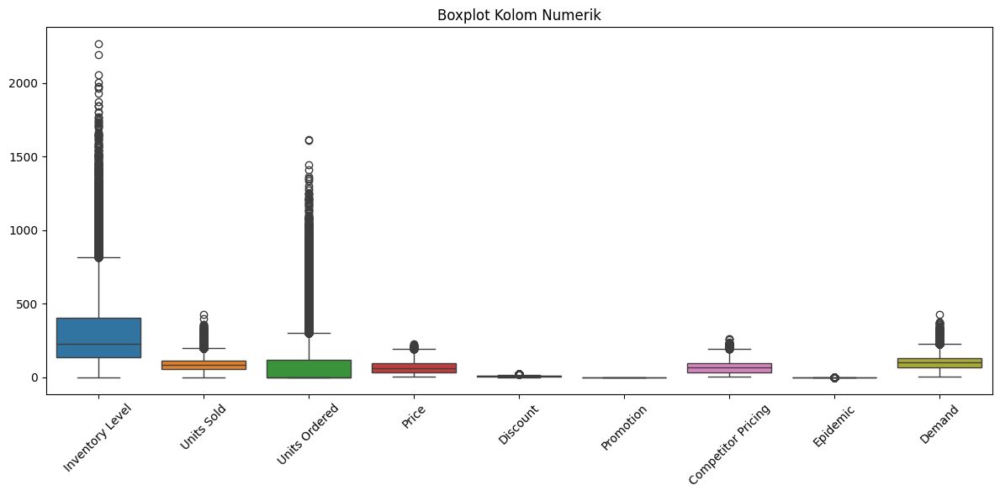

In [ ]:
import seaborn as sns

plt.figure(figsize=(12, 6), )
sns.boxplot(data=df[kolom_numerik])
plt.title('Boxplot Kolom Numerik')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Untuk data Discount, Price, dan Competitor pricing distribusinya sempit sehingga kecil kemungkinan outlier nya (data masih masuk akal). Untuk data Promotion dan Epidemic hanya berisi 0/1 sehingga tidak ada outlier.
Data kolom Inventory Level, Units Sold, Units Ordered, dan Demand akan dicek lebih lanjut.

In [ ]:
# Cek outliers kolom Inventory Level
col = 'Inventory Level'

# Hitung Q1, Q3, dan IQR
Q1 = df[col].quantile(0.25)
Q3 = df[col].quantile(0.75)
IQR = Q3 - Q1

# Tentukan batas bawah dan atas
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Deteksi outlier
outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]

# Tampilkan hasil
print(f"IQR untuk {col}: {IQR}")
print(f"Batas atas: {upper_bound}")
print(f"Jumlah outlier: {len(outliers)}")
print(outliers[[col, 'Units Sold', 'Units Ordered', 'Demand', 'Product ID','Category', 'Date']])

IQR untuk Inventory Level: 272.0
Batas atas: 816.0
Jumlah outlier: 2759
       Inventory Level  Units Sold  Units Ordered  Demand Product ID  \
489                963         144              0     157      P0010   
531                864          70              0      92      P0012   
534                985         117              0     107      P0015   
554               1032          59              0      77      P0015   
560                933          85              0     126      P0001   
...                ...         ...            ...     ...        ...   
75804             1024          78              0     123      P0005   
75844              822          40              0      66      P0005   
75852              852          71              0     109      P0013   
75904              946          29              0      29      P0005   
75934             1039          56              0      67      P0015   

          Category        Date  
489      Groceries  2022-01-05

Dugaan data outliers pada inventory level masih masuk akal dilihat dari units sold, unit ordered, dan demand di hari yang sama. Inventory level yang tinggi didukung dengan tidak dilakukannya units ordered (0) agar tidak overstock sehingga inventory level tinggi ini penyesuaian dari inventory level sebelumnya yang mungkin sudah sedikit. Data ini tidak akan dihapus, tetap dipertahankan.

In [ ]:
# Cek outliers kolom Units Sold
col = 'Units Sold'

# Hitung Q1, Q3, dan IQR
Q1 = df[col].quantile(0.25)
Q3 = df[col].quantile(0.75)
IQR = Q3 - Q1

# Tentukan batas bawah dan atas
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Deteksi outlier
outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]

# Tampilkan hasil
print(f"IQR untuk {col}: {IQR}")
print(f"Batas atas: {upper_bound}")
print(f"Jumlah outlier: {len(outliers)}")
print(outliers[[col, 'Product ID', 'Date', 'Promotion', 'Discount']])

IQR untuk Units Sold: 56.0
Batas atas: 198.0
Jumlah outlier: 1411
       Units Sold Product ID        Date  Promotion  Discount
368           201      P0009  2022-01-04          1        15
428           243      P0009  2022-01-05          1        10
430           206      P0011  2022-01-05          1        10
450           243      P0011  2022-01-05          1        25
469           218      P0010  2022-01-05          1        20
...           ...        ...         ...        ...       ...
75472         246      P0013  2024-01-25          1        25
75634         207      P0015  2024-01-27          1        10
75717         237      P0018  2024-01-28          1        15
75765         265      P0006  2024-01-28          1        25
75802         222      P0003  2024-01-29          0         5

[1411 rows x 5 columns]


Data dugaan outliers pada kolom Units Sold masih masuk akal karena units sold dalam jumlah banyak terjadi ketika ada promosi (promotion=1) dan diskon yang cukup besar. Data ini tetap akan dipertahankan.

In [ ]:
pd.set_option('display.max_rows', None)
# Cek outliers kolom Units Ordered
col = 'Units Ordered'

# Hitung Q1, Q3, dan IQR
Q1 = df[col].quantile(0.25)
Q3 = df[col].quantile(0.75)
IQR = Q3 - Q1

# Tentukan batas bawah dan atas
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Deteksi outlier
outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]

# Tampilkan hasil
print(f"IQR untuk {col}: {IQR}")
print(f"Batas atas: {upper_bound}")
print(f"Jumlah outlier: {len(outliers)}")
print(outliers[[col, 'Units Sold', 'Inventory Level' , 'Demand', 'Product ID']])

IQR untuk Units Ordered: 121.0
Batas atas: 302.5
Jumlah outlier: 7524
       Units Ordered  Units Sold  Inventory Level  Demand Product ID
2                612         114              247     157      P0003
6                335          81              118      94      P0007
13               479         121              252     165      P0014
15               372          78              103     115      P0016
20               331         102              102     118      P0001
22               596         167              187     171      P0003
23               339         111              160     110      P0004
24               334         103              155      94      P0005
31               413          78              197     122      P0012
32               331          93              152     109      P0013
34               457          70              106      96      P0015
35               323         113              113     194      P0016
38               391          82 

Dari data yang tertampil, kondisi ini masih sangat masuk akal karena estimasi demand yang cukup tinggi sehingga units orderednya disesuaikan untuk tinggi pula sebagai upaya menjaga stock. Data ini tetap dipertahankan

In [ ]:
# Cek outliers kolom Units Ordered
col = 'Demand'

# Hitung Q1, Q3, dan IQR
Q1 = df[col].quantile(0.25)
Q3 = df[col].quantile(0.75)
IQR = Q3 - Q1

# Tentukan batas bawah dan atas
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Deteksi outlier
outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]

# Tampilkan hasil
print(f"IQR untuk {col}: {IQR}")
print(f"Batas atas: {upper_bound}")
print(f"Jumlah outlier: {len(outliers)}")
print(outliers[[col, 'Units Sold', 'Inventory Level' , 'Discount', 'Promotion', 'Product ID']])

IQR untuk Demand: 62.0
Batas atas: 226.0
Jumlah outlier: 986
       Demand  Units Sold  Inventory Level  Discount  Promotion Product ID
1         229         117              117        15          1      P0002
129       234         179              318        25          1      P0010
353       227         128              128        25          1      P0014
368       235         201              299        15          1      P0009
428       236         243              279        10          1      P0009
458       307         106              106        25          1      P0019
659       259         169              769        10          1      P0020
717       227         134              134        15          1      P0018
746       279         315              791        25          1      P0007
759       256         210              600         0          0      P0020
859       263         222              390        15          1      P0020
899       248         104              

Estimasi dari Demand yang tinggi disebabkan karena adanya promotion dan diskon. Data ini masuk akal dan akan tetap dipertahankan

Dugaan outlier pada setiap kolom telah dianalisis dan dianggap valid secara kontekstual, sehingga tidak dihapus agar tetap mencerminkan kondisi bisnis yang realistis.

## Data Manipulation

In [ ]:
df['Date'] = pd.to_datetime(df['Date'])

In [ ]:
# melihat tanggal tertentu weekend atau bukan
df['Weekend'] = df['Date'].dt.dayofweek.isin([5,6])
df.sample()

,Date,Store ID,Product ID,Category,Region,Inventory Level,Units Sold,Units Ordered,Price,Discount,Weather Condition,Promotion,Competitor Pricing,Seasonality,Epidemic,Demand,Weekend
49042,2023-05-06,S003,P0003,Electronics,East,194,71,0,76.6,15,Cloudy,1,90.65,Spring,1,97,True


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 76000 entries, 0 to 75999
Data columns (total 17 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   Date                76000 non-null  datetime64[ns]
 1   Store ID            76000 non-null  object        
 2   Product ID          76000 non-null  object        
 3   Category            76000 non-null  object        
 4   Region              76000 non-null  object        
 5   Inventory Level     76000 non-null  int64         
 6   Units Sold          76000 non-null  int64         
 7   Units Ordered       76000 non-null  int64         
 8   Price               76000 non-null  float64       
 9   Discount            76000 non-null  int64         
 10  Weather Condition   76000 non-null  object        
 11  Promotion           76000 non-null  int64         
 12  Competitor Pricing  76000 non-null  float64       
 13  Seasonality         76000 non-null  object    

In [ ]:
# bikin df untuk EDA agar df asli masih bisa diakses
df_eda = df.copy()

## EDA

### Tren Penjualan Harian

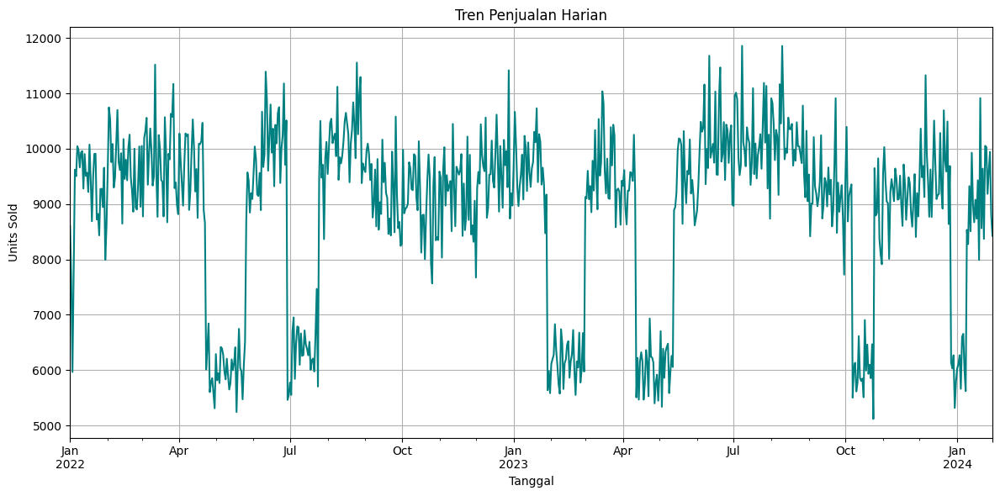

In [ ]:
# Grouping total penjualan per hari
daily_sales = df_eda.groupby('Date')['Units Sold'].sum()

# Plot tren penjualan harian
plt.figure(figsize=(12,6))
daily_sales.plot(kind='line', color='teal')
plt.title('Tren Penjualan Harian')
plt.xlabel('Tanggal')
plt.ylabel('Units Sold')
plt.grid(True)
plt.tight_layout()
plt.show()

Data penjualan dari januari 2022 - jan 2024 mengalami fluktuatif. Secara sekilas terlihat ada pola nya, penurunan penjualan 2 kali dengan diselingi kenaikan penjualan selama sekitar 1 bulan.

### Tren Penjualan berdasarkan pola musim (seasonality)

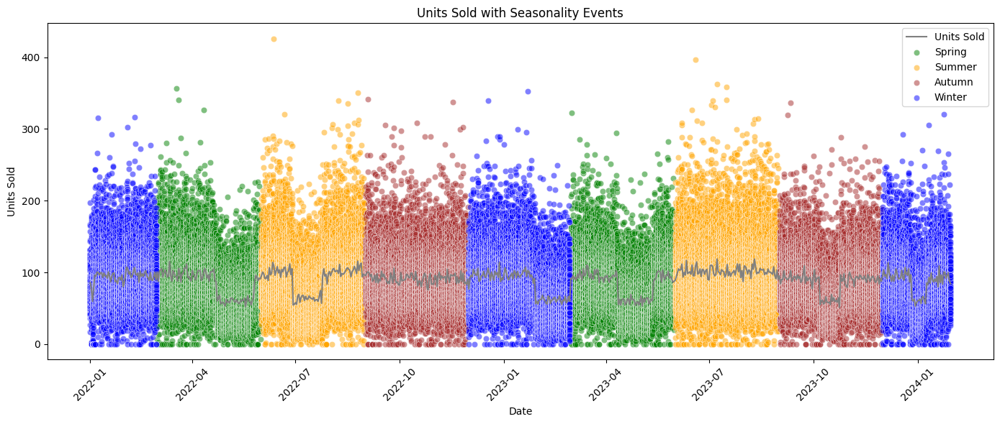

In [ ]:
plt.figure(figsize=(14, 6))
sns.lineplot(data=df_eda, x="Date", y="Units Sold", label="Units Sold", color="gray")
season_colors = {"Spring": "green", "Summer": "orange", "Autumn": "brown", "Winter": "blue"}

for season, color in season_colors.items():
    sns.scatterplot(
        data=df_eda[df_eda["Seasonality"] == season],
        x="Date", y="Units Sold",
        label=season.capitalize(),
        color=color, alpha=0.5
    )

plt.title("Units Sold with Seasonality Events")
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

### Tren Penjualan berdasarkan pola promosi

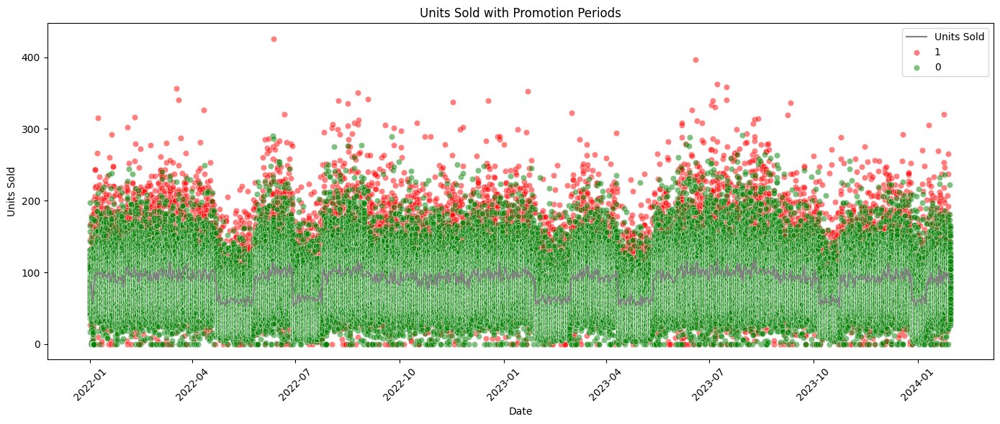

In [ ]:
plt.figure(figsize=(14, 6))
sns.lineplot(data=df_eda, x="Date", y="Units Sold", label="Units Sold", color="gray")
promotion_colors = {1: "red", 0: "green"}
for promotion, color in promotion_colors.items():
    sns.scatterplot(
        data=df_eda[df_eda["Promotion"] == promotion],
        x="Date", y="Units Sold",
        label=promotion,
        color=color, alpha=0.5
    )
plt.title("Units Sold with Promotion Periods")
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [ ]:
promo_avg = df_eda[df_eda["Promotion"] == 1]["Units Sold"].mean()
nonpromo_avg = df_eda[df_eda["Promotion"] == 0]["Units Sold"].mean()
print(f"Avg saat Promo: {promo_avg:.2f}, Tanpa Promo: {nonpromo_avg:.2f}")

Avg saat Promo: 103.10, Tanpa Promo: 81.83


In [ ]:
from scipy.stats import ttest_ind

promo_sales = df_eda[df_eda["Promotion"] == 1]["Units Sold"]
nonpromo_sales = df_eda[df_eda["Promotion"] == 0]["Units Sold"]

stat, pval = ttest_ind(promo_sales, nonpromo_sales, equal_var=False)
print(f"T-test p-value: {pval:.4f}")

T-test p-value: 0.0000


Rata-rata Units Sold saat Promo: 103.10

Rata-rata saat Tidak Promo: 81.83 → Ada kenaikan hampir 26% saat promo berlangsung.

T-test p-value: 0.0000 → Artinya perbedaan ini sangat signifikan secara statistik (p < 0.05). Dengan kata lain, kecil kemungkinan bahwa perbedaan ini hanya kebetulan.

### Tren Penjualan berdasarkan pola epidemic

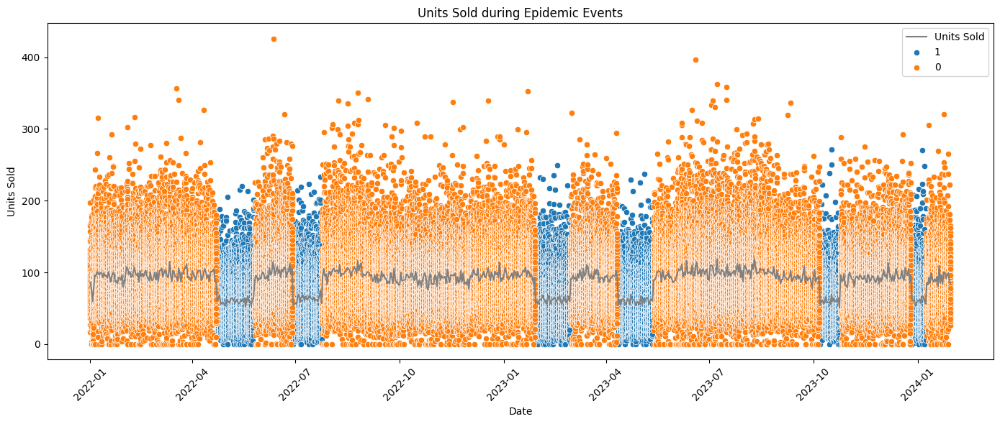

In [ ]:
plt.figure(figsize=(14, 6))
sns.lineplot(data=df_eda, x="Date", y="Units Sold", label="Units Sold", color="gray")

epidemic_colors = {1: "red", 0: "green"}
for epidemic, color in epidemic_colors.items():
    sns.scatterplot(
        data=df_eda[df_eda["Epidemic"] == epidemic],
        x="Date", y="Units Sold",
        label=epidemic)

plt.title("Units Sold during Epidemic Events")
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()



In [ ]:
epidemic_avg = df_eda[df_eda["Epidemic"] == 1]["Units Sold"].mean()
nonepidemic_avg = df_eda[df_eda["Epidemic"] == 0]["Units Sold"].mean()
print(f"Rata-rata saat Epidemic: {epidemic_avg:.2f}, Tanpa Epidemic: {nonepidemic_avg:.2f}")

Rata-rata saat Epidemic: 60.86, Tanpa Epidemic: 95.82


### Total Penjualan per Kategori Produk

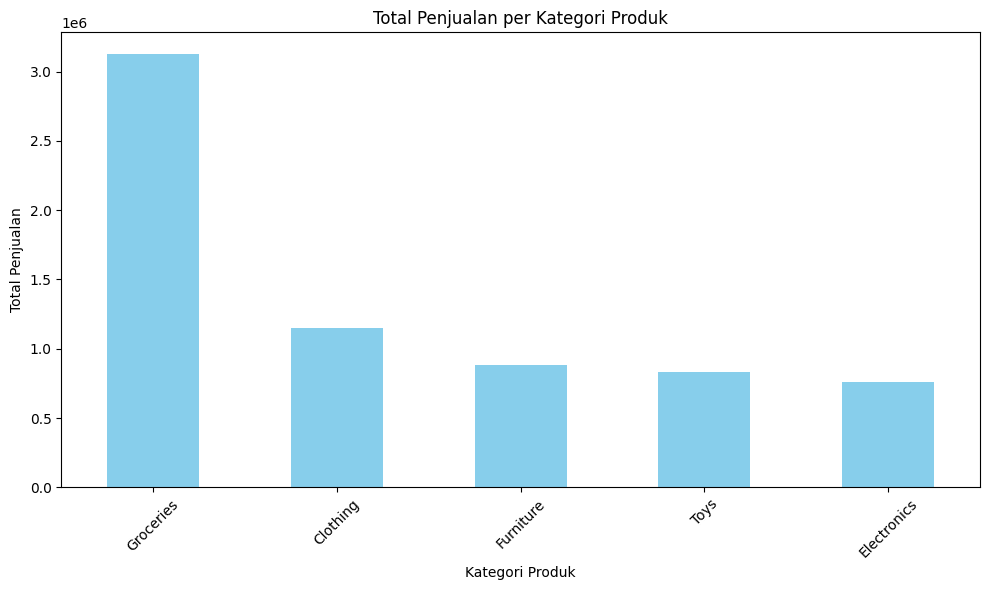

In [ ]:
# Grouping penjualan per kategori
sales_per_category = df_eda.groupby('Category')['Units Sold'].sum().sort_values(ascending=False)

# Plot bar chart
plt.figure(figsize=(10,6))
sales_per_category.plot(kind='bar', color='skyblue')
plt.title('Total Penjualan per Kategori Produk')
plt.xlabel('Kategori Produk')
plt.ylabel('Total Penjualan')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [ ]:
sales_per_category

,Units Sold
Category,
Groceries,3127335
Clothing,1150873
Furniture,880654
Toys,834679
Electronics,757335


Groceries menjadi kategori produk paling banyak dibeli by total unit (bukan price)

### Penjualan Kategori Produk Tiap Musim

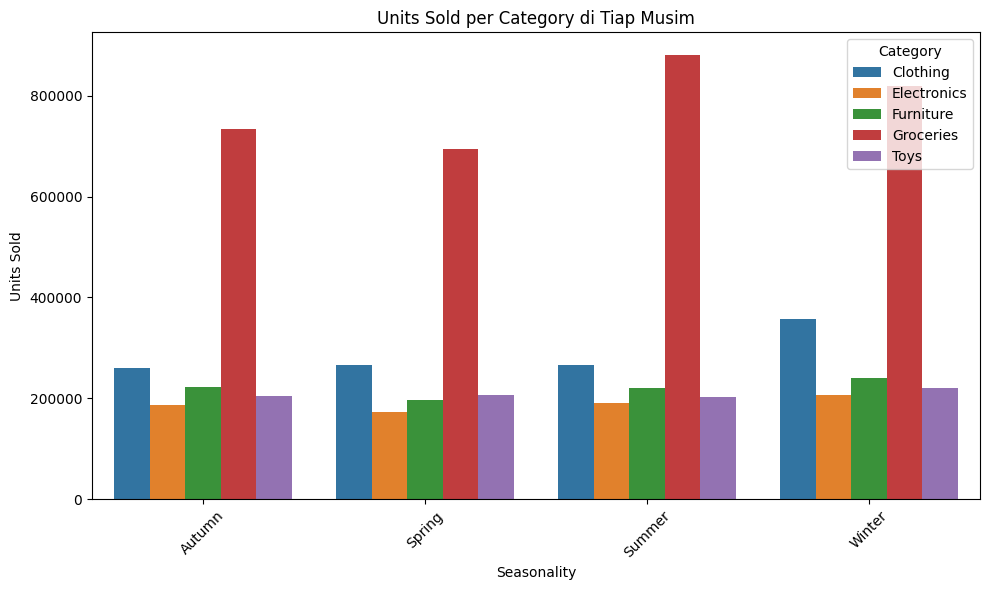

In [ ]:
# Grouping Units Sold per Category dan Seasonality
category_season = df_eda.groupby(['Category', 'Seasonality'])['Units Sold'].sum().reset_index()

# Visualisasi
plt.figure(figsize=(10,6))
sns.barplot(data=category_season, x='Seasonality', y='Units Sold', hue='Category')
plt.title('Units Sold per Category di Tiap Musim')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [ ]:
seasonal_pivot = df_eda.groupby(["Seasonality", "Category"])["Units Sold"].mean().unstack().round(1)
seasonal_pivot.style.background_gradient(cmap="YlGnBu")


Category,Clothing,Electronics,Furniture,Groceries,Toys
Seasonality,,,,,
Autumn,89.700000,85.700000,68.000000,100.700000,80.700000
Spring,90.600000,78.100000,59.300000,94.300000,79.900000
Summer,90.300000,86.200000,66.900000,119.800000,78.800000
Winter,106.300000,82.300000,63.500000,97.400000,74.900000


In [ ]:
df_eda.groupby(['Category', 'Seasonality', 'Region'])['Units Sold'].sum().unstack()

Region                       East     North     South      West
Category    Seasonality                                        
Clothing    Autumn        32429.0   70047.0   78622.0   80030.0
            Spring        33610.0   72471.0   77931.0   82807.0
            Summer        32206.0   71055.0   79426.0   83210.0
            Winter        45597.0   95454.0  107201.0  108777.0
Electronics Autumn        51520.0   74434.0   46937.0   14317.0
            Spring        48114.0   68162.0   43294.0   12960.0
            Summer        51412.0   76309.0   48393.0   14198.0
            Winter        57717.0   83882.0   50465.0   15221.0
Furniture   Autumn        38585.0   85804.0   12079.0   86304.0
            Spring        33061.0   76920.0   10867.0   75581.0
            Summer        36661.0   86691.0   12418.0   85656.0
            Winter        39067.0   95290.0   13460.0   92210.0
Groceries   Autumn       163541.0  295546.0  142359.0  131825.0
            Spring       154020.0  275165.0  139628.0  125281.0
            Summer       197539.0  354277.0  174124.0  155474.0
            Winter       180731.0  329543.0  163942.0  144340.0
Toys        Autumn        44540.0  115658.0   45443.0       NaN
            Spring        44269.0  115769.0   45820.0       NaN
            Summer        43262.0  114987.0   44647.0       NaN
            Winter        47732.0  123482.0   49070.0       NaN

*Insight*
1. Clothing banyak terjual saat musim winter dihampir semua region, peringkat pertama diduduki oleh region West. Sedangkan penjualan clothing paling sedikit adalah ketika autumn
2. Electronics dan furniture banyak terjual saat winter (diduduki oleh North di peringkat pertama) dan paling sedikit saat spring.
3. Groceries sangat banyak terjual ketika summer
4. Tidak ada penjualan toys di region West, untuk akumulasi region lain, penjualan toys hanya selisih sedikit setiap musimnya di masing-masing region

### Efisiensi Inventory per Kategori

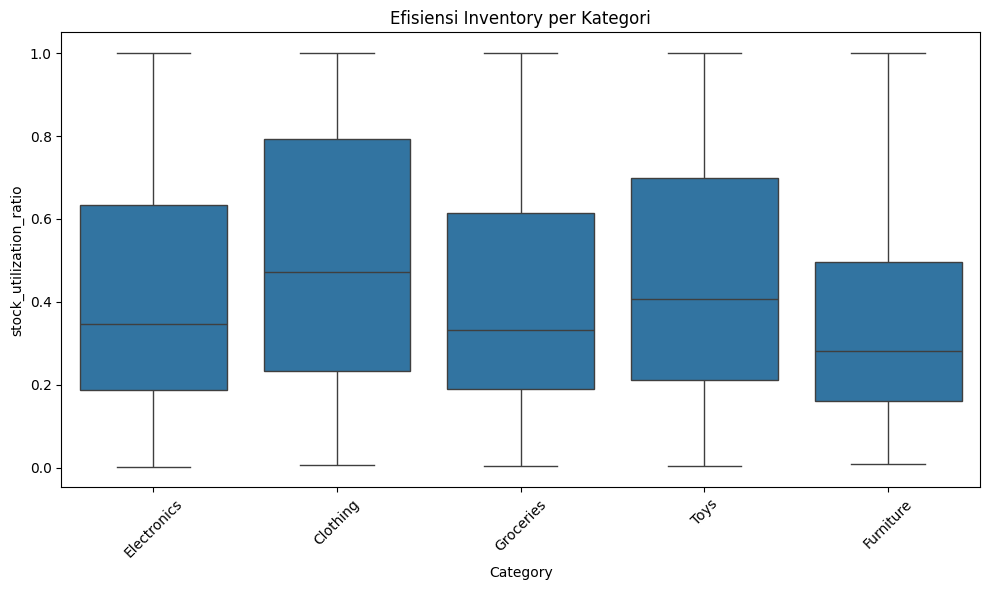

In [ ]:
# melihat apakah stock yang ada benar-benar dimanfaatkan untuk penjualan?
# Hitung gap dan efisiensi
df_eda['stock_utilization_ratio'] = df_eda['Units Sold'] / df_eda['Inventory Level']

# Boxplot efisiensi per kategori
plt.figure(figsize=(10,6))
sns.boxplot(data=df_eda, x='Category', y='stock_utilization_ratio')
plt.title('Efisiensi Inventory per Kategori')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()



Clothing	~0.5	Cukup efisien, stok terjual separuhnya secara konsisten<br>
Toys	~0.5	Mirip Clothing, bisa jadi stok disiapkan sesuai permintaan<br>
Groceries	~0.4	Sedikit lebih rendah, mungkin karena stok cepat kadaluarsa<br>
Electronics	~0.4	Stok besar tapi penjualan tidak secepat kategori lain<br>
Furniture	~0.3	Paling rendah → kemungkinan overstock atau demand lambat<br>

### Demand gap (%)

In [ ]:
df_eda['demand_gap(%)'] = ((df_eda['Demand']-df_eda['Units Sold'])/df_eda['Demand'])*100
df_eda.head()

,Date,Store ID,Product ID,Category,Region,Inventory Level,Units Sold,Units Ordered,Price,Discount,Weather Condition,Promotion,Competitor Pricing,Seasonality,Epidemic,Demand,Weekend,stock_utilization_ratio,demand_gap(%)
0,2022-01-01,S001,P0001,Electronics,North,195,102,252,72.72,5,Snowy,0,85.73,Winter,0,115,True,0.523077,11.304348
1,2022-01-01,S001,P0002,Clothing,North,117,117,249,80.16,15,Snowy,1,92.02,Winter,0,229,True,1.000000,48.908297
2,2022-01-01,S001,P0003,Clothing,North,247,114,612,62.94,10,Snowy,1,60.08,Winter,0,157,True,0.461538,27.388535
3,2022-01-01,S001,P0004,Electronics,North,139,45,102,87.63,10,Snowy,0,85.19,Winter,0,52,True,0.323741,13.461538
4,2022-01-01,S001,P0005,Groceries,North,152,65,271,54.41,0,Snowy,0,51.63,Winter,0,59,True,0.427632,-10.169492


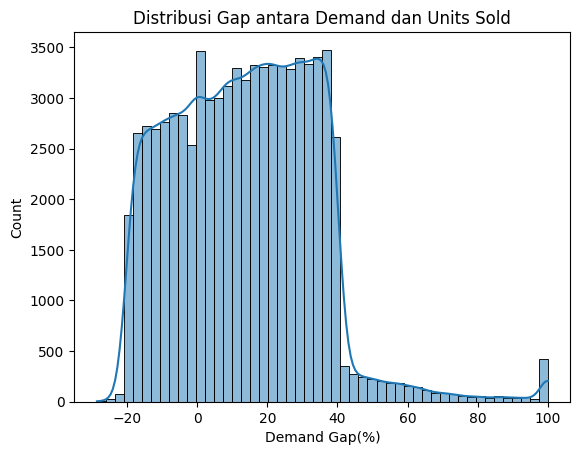

In [ ]:
sns.histplot(df_eda['demand_gap(%)'], bins=50, kde=True)
plt.title('Distribusi Gap antara Demand dan Units Sold')
plt.xlabel('Demand Gap(%)')
plt.show()

In [ ]:
df_eda.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 76000 entries, 0 to 75999
Data columns (total 19 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   Date                     76000 non-null  datetime64[ns]
 1   Store ID                 76000 non-null  object        
 2   Product ID               76000 non-null  object        
 3   Category                 76000 non-null  object        
 4   Region                   76000 non-null  object        
 5   Inventory Level          76000 non-null  int64         
 6   Units Sold               76000 non-null  int64         
 7   Units Ordered            76000 non-null  int64         
 8   Price                    76000 non-null  float64       
 9   Discount                 76000 non-null  int64         
 10  Weather Condition        76000 non-null  object        
 11  Promotion                76000 non-null  int64         
 12  Competitor Pricing       76000 n

## Feature Engineering

In [ ]:
# Kolom demand tidak akan digunakan menjadi salah satu fitur di model karena kolom demand merupakan prediksi dari pihak lain/pemilik dataset
# drop kolom Demand
df.drop(columns=['Demand'], inplace=True)

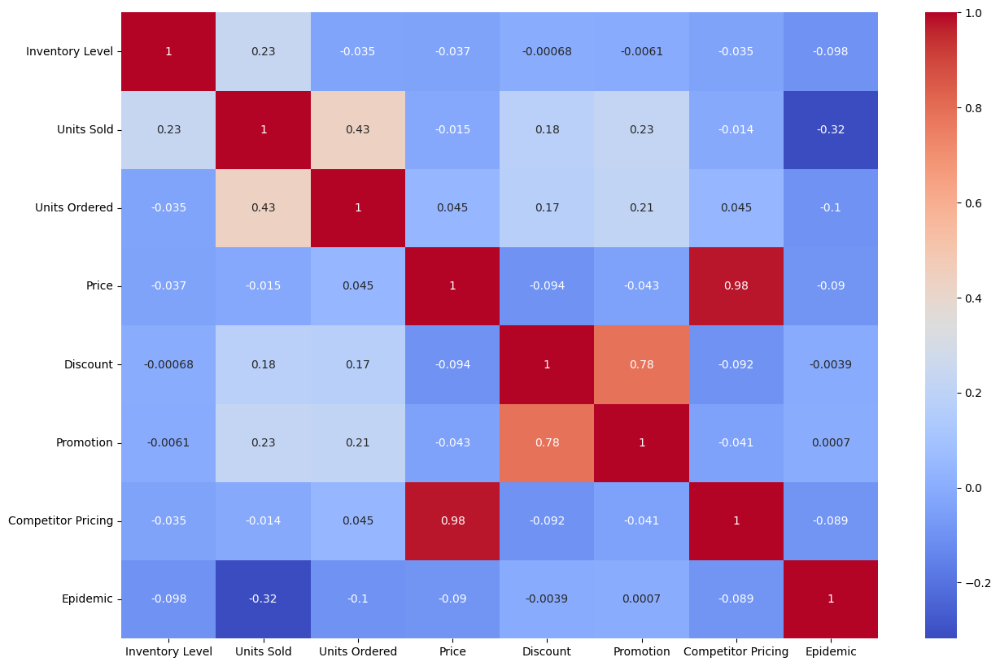

In [ ]:
#heatmap korelasi fitur numerik

corr = df.select_dtypes(include='number').corr()
plt.figure(figsize=(15,10))
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.show()

Calon-calon fitur yang saling berkorelasi akan dilakukan feature engineering

In [ ]:
# ubah diskon menjadi beberapa cluster/segmen 10% = rendah, 15-20%= sedang 25% = tinggi

bins = [-0.01, 10, 20, 100]  # rentang diskon
labels = ["rendah", "sedang", "tinggi"]

df["discount_level"] = pd.cut(df["Discount"], bins=bins, labels=labels)


<Axes: xlabel='Price', ylabel='Count'>

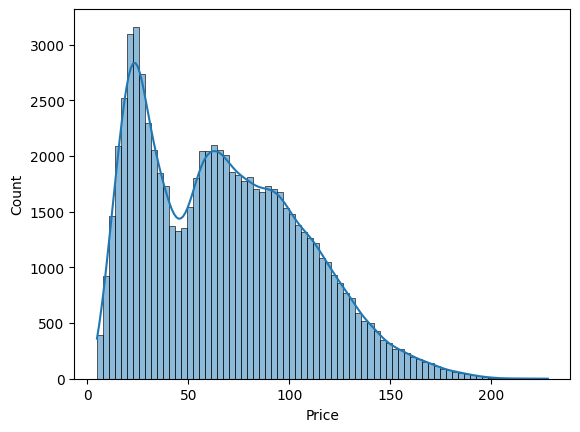

In [ ]:
# liat distribusi price biar bisa nentuin price level
sns.histplot(df['Price'], kde=True)

In [ ]:
# buat price_level
bins = [-0.01, 75, 150, np.inf]  # rentang harga
labels = ["murah", "sedang", "mahal"]
df['price_level'] = pd.cut(df['Price'], bins=bins, labels=labels)

In [ ]:
df['Price_Diff'] = df['Price'] - df['Competitor Pricing']

In [ ]:
# drop discount dan price karena sudah diganti menjadi discount_level, price_level
df.drop(columns=['Discount', 'Price', 'Competitor Pricing'], inplace=True)

In [ ]:
# df pada batas ini akan dipanggil lagi untuk masing-masing model
df_model_sarimax = df.copy()
df_ml = df.copy()


In [ ]:
df_model_sarimax.to_csv('df_model_sarimax.csv', index=True)
print(" df_model_sarimax.csv berhasil disimpan.")

 df_model_sarimax.csv berhasil disimpan.


df_ml -> untuk model xgboost
df_sarimax -> untuk model sarimax
pemisahan ini dilakukan karena akan dilakukan preprocessing sebelum pembuatan masing-masing model.

# EDA segmented Category

In [ ]:
df = df.sort_values(by='Date').set_index('Date')

df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 76000 entries, 2022-01-01 to 2024-01-30
Data columns (total 15 columns):
 #   Column             Non-Null Count  Dtype   
---  ------             --------------  -----   
 0   Store ID           76000 non-null  object  
 1   Product ID         76000 non-null  object  
 2   Category           76000 non-null  object  
 3   Region             76000 non-null  object  
 4   Inventory Level    76000 non-null  int64   
 5   Units Sold         76000 non-null  int64   
 6   Units Ordered      76000 non-null  int64   
 7   Weather Condition  76000 non-null  object  
 8   Promotion          76000 non-null  int64   
 9   Seasonality        76000 non-null  object  
 10  Epidemic           76000 non-null  int64   
 11  Weekend            76000 non-null  bool    
 12  discount_level     76000 non-null  category
 13  price_level        76000 non-null  category
 14  Price_Diff         76000 non-null  float64 
dtypes: bool(1), category(2), float64(1),

In [ ]:
# Agregasi Data ke Harian (hanya untuk pengujian stasioner)
df_category = df.groupby(['Date', 'Category']).agg({
    'Units Sold': 'sum',
    'Inventory Level': 'median',
    'Units Ordered': 'sum',
    'Price_Diff': 'mean',
    'Weekend': 'first',
    'Promotion': 'first',
    'Weather Condition': 'first',
    'Seasonality': 'first',
    'Epidemic': 'first',
    'discount_level': 'first',
    'price_level': 'first'
}).reset_index()

print(df_category.info())
print(df_category.head(5))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3800 entries, 0 to 3799
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   Date               3800 non-null   datetime64[ns]
 1   Category           3800 non-null   object        
 2   Units Sold         3800 non-null   int64         
 3   Inventory Level    3800 non-null   float64       
 4   Units Ordered      3800 non-null   int64         
 5   Price_Diff         3800 non-null   float64       
 6   Weekend            3800 non-null   bool          
 7   Promotion          3800 non-null   int64         
 8   Weather Condition  3800 non-null   object        
 9   Seasonality        3800 non-null   object        
 10  Epidemic           3800 non-null   int64         
 11  discount_level     3800 non-null   category      
 12  price_level        3800 non-null   category      
dtypes: bool(1), category(2), datetime64[ns](1), float64(2), int64(4

## Pengujian Stasioner

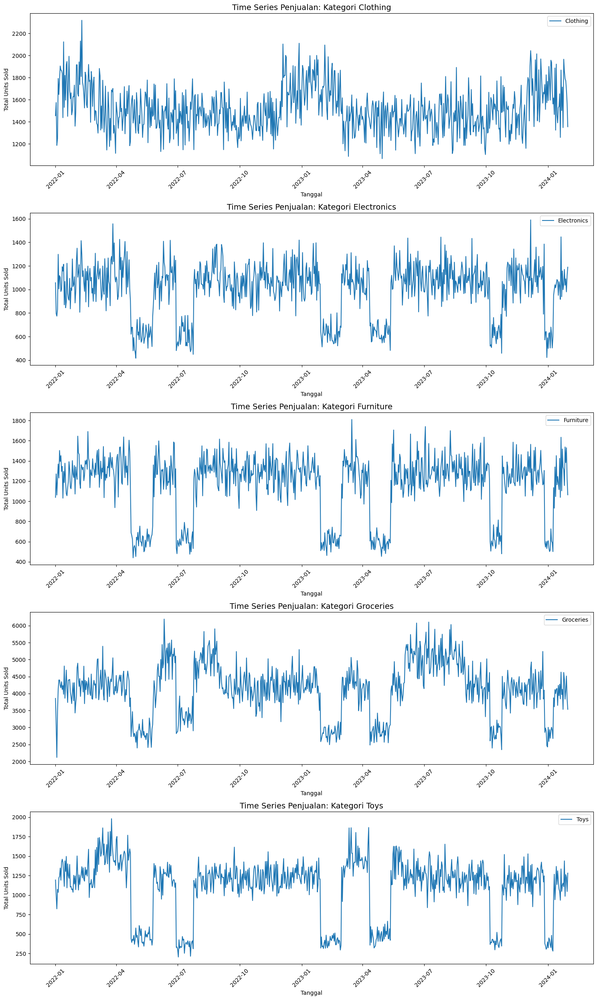

In [ ]:
# menyimpan nama-nama Category produk
unique_categories = df_category['Category'].unique()

# Buat subplot untuk setiap kategori
fig, axes = plt.subplots(nrows=len(unique_categories), ncols=1, figsize=(15, 5 * len(unique_categories)))

# Loop melalui setiap kategori dan buat plot
for i, category in enumerate(unique_categories):
    df_temp = df_category[df_category['Category'] == category]

    # Plot time series
    sns.lineplot(data=df_temp, x='Date', y='Units Sold', ax=axes[i], label=category)

    # Atur judul dan label
    axes[i].set_title(f'Time Series Penjualan: Kategori {category}', fontsize=14)
    axes[i].set_xlabel('Tanggal')
    axes[i].set_ylabel('Total Units Sold')
    axes[i].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

In [ ]:
from statsmodels.tsa.stattools import adfuller
for category in unique_categories:
    # Filter DataFrame untuk satu kategori
    ts_data = df_category[df_category['Category'] == category]['Units Sold'].dropna()

    # pengujian ADF
    result = adfuller(ts_data)
    adf_statistic = result[0]
    p_value = result[1]
    critical_5_percent = result[4]['5%']

    # Tampilkan hasilnya
    print(f"Kategori: {category}")
    print(f"ADF Statistic: {adf_statistic:.4f}")
    print(f"p-value: {p_value:.4f}")
    print(f"Nilai Kritis (5%): {critical_5_percent:.4f}")

    # perbandingan nilai adf dengan nilai kritis
    if adf_statistic < critical_5_percent:
        print("Kesimpulan (ADF vs. Nilai Kritis): Nilai ADF lebih kecil dari nilai kritis, mengindikasikan stationary.")
    else:
        print("Kesimpulan (ADF vs. Nilai Kritis): Nilai ADF lebih besar dari nilai kritis, mengindikasikan non-stationary.")

Kategori: Clothing
ADF Statistic: -5.1037
p-value: 0.0000
Nilai Kritis (5%): -2.8654
Kesimpulan (ADF vs. Nilai Kritis): Nilai ADF lebih kecil dari nilai kritis, mengindikasikan stationary.
Kategori: Electronics
ADF Statistic: -5.0011
p-value: 0.0000
Nilai Kritis (5%): -2.8654
Kesimpulan (ADF vs. Nilai Kritis): Nilai ADF lebih kecil dari nilai kritis, mengindikasikan stationary.
Kategori: Furniture
ADF Statistic: -4.6366
p-value: 0.0001
Nilai Kritis (5%): -2.8654
Kesimpulan (ADF vs. Nilai Kritis): Nilai ADF lebih kecil dari nilai kritis, mengindikasikan stationary.
Kategori: Groceries
ADF Statistic: -4.2482
p-value: 0.0005
Nilai Kritis (5%): -2.8654
Kesimpulan (ADF vs. Nilai Kritis): Nilai ADF lebih kecil dari nilai kritis, mengindikasikan stationary.
Kategori: Toys
ADF Statistic: -4.8299
p-value: 0.0000
Nilai Kritis (5%): -2.8654
Kesimpulan (ADF vs. Nilai Kritis): Nilai ADF lebih kecil dari nilai kritis, mengindikasikan stationary.


## Decomposition

In [ ]:
df_category = df_category.sort_values('Date')
df_category_indexed = df_category.set_index('Date')

In [ ]:
# untuk category groceries
category_to_decompose = 'Groceries'
df_temp = df_category_indexed[df_category_indexed['Category'] == category_to_decompose]

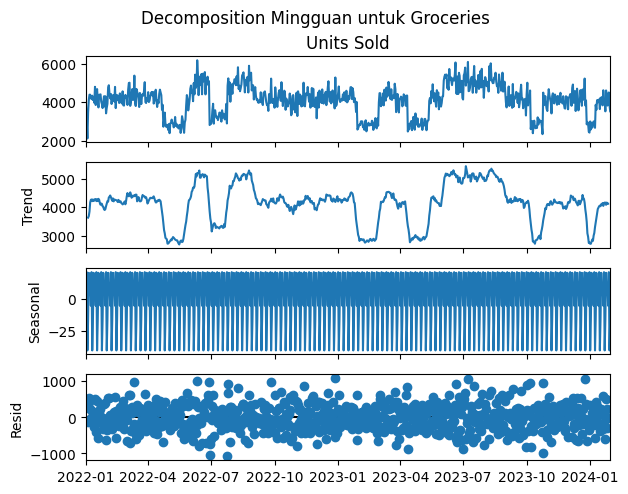

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose
decomposition_weekly = seasonal_decompose(df_temp['Units Sold'], model='additive', period=7)
decomposition_weekly.plot()
plt.suptitle(f'Decomposition Mingguan untuk {category_to_decompose}', y=1.02)
plt.show()

Untuk kategori groceries terdapat pola musiman yang konsisten, rapat, dan berulang tiap minggu. Pada plot residual, menandakankan variasi yang tinggi akibat event tak terduga.

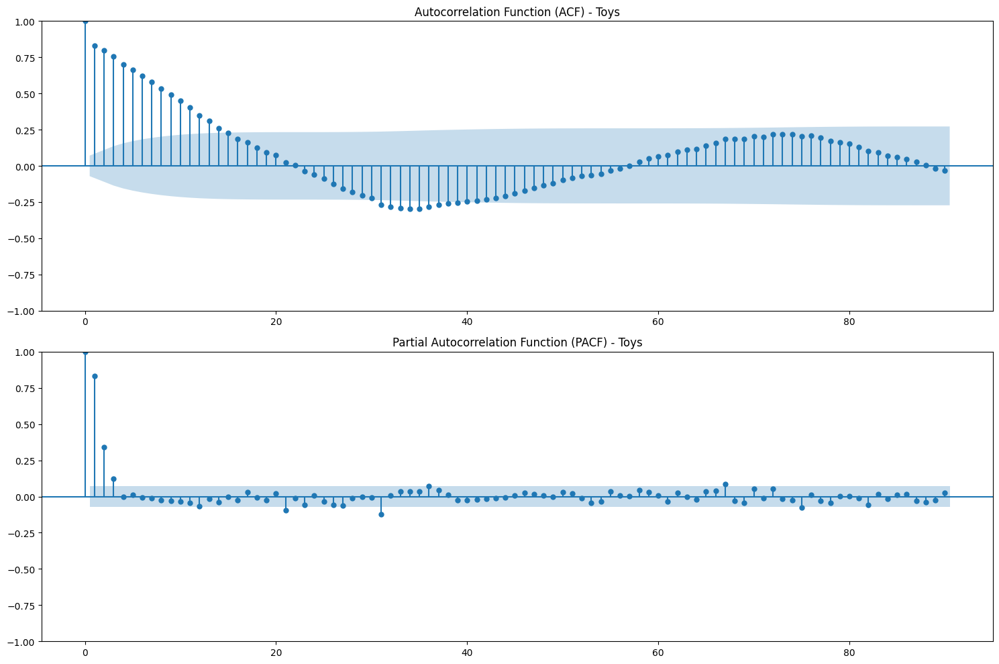

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
# hanya untuk toys saja(untuk contoh)
category_to_plot = 'Toys'
ts_data = df_category[df_category['Category'] == category_to_plot]['Units Sold'].dropna()
# Atur ukuran plot
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(15, 10))

# Plot ACF
plot_acf(ts_data, lags=90, ax=axes[0])
axes[0].set_title(f'Autocorrelation Function (ACF) - {category_to_plot}')

# Plot PACF
plot_pacf(ts_data, lags=90, ax=axes[1])
axes[1].set_title(f'Partial Autocorrelation Function (PACF) - {category_to_plot}')

plt.tight_layout()
plt.show()

--------------------------------------------------------------------------------

# Model XGBOOST



In [ ]:
# buat lag historis dengan grouping
df_ml['Lag_1'] = df_ml.groupby('Category')['Units Sold'].shift(1)
df_ml['Lag_7'] = df_ml.groupby('Category')['Units Sold'].shift(7)
df_ml['Lag_30'] = df_ml.groupby('Category')['Units Sold'].shift(30)
# buat rolling
df_ml['Rolling_Mean_7'] = df_ml.groupby('Category')['Units Sold'].rolling(window=7).mean().reset_index(level=[0, 1], drop=True)
df_ml.head()

,Date,Store ID,Product ID,Category,Region,Inventory Level,Units Sold,Units Ordered,Weather Condition,Promotion,Seasonality,Epidemic,Weekend,discount_level,price_level,Price_Diff,Lag_1,Lag_7,Lag_30,Rolling_Mean_7
0,2022-01-01,S001,P0001,Electronics,North,195,102,252,Snowy,0,Winter,0,True,rendah,murah,-13.01,NaN,NaN,NaN,NaN
1,2022-01-01,S001,P0002,Clothing,North,117,117,249,Snowy,1,Winter,0,True,sedang,sedang,-11.86,NaN,NaN,NaN,NaN
2,2022-01-01,S001,P0003,Clothing,North,247,114,612,Snowy,1,Winter,0,True,rendah,murah,2.86,117.0,NaN,NaN,NaN
3,2022-01-01,S001,P0004,Electronics,North,139,45,102,Snowy,0,Winter,0,True,rendah,sedang,2.44,102.0,NaN,NaN,NaN
4,2022-01-01,S001,P0005,Groceries,North,152,65,271,Snowy,0,Winter,0,True,rendah,murah,2.78,NaN,NaN,NaN,NaN


In [ ]:
# drop yang NaN di lag_1, lag_7, dan lag_30
df_ml.dropna(subset=['Lag_1', 'Lag_7', 'Lag_30'], inplace=True)
# drop yang Nan di rolling_mean_7
df_ml.dropna(subset=['Rolling_Mean_7'], inplace=True)

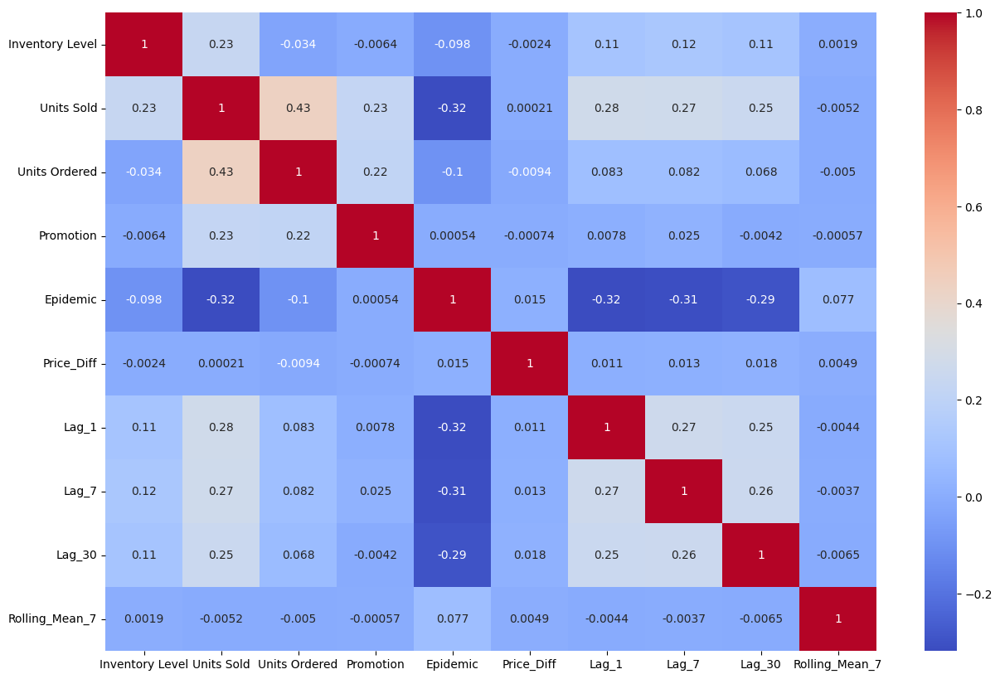

In [ ]:
# heatmap korelasi
corr = df_ml.select_dtypes(include='number').corr()
plt.figure(figsize=(15,10))
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.show()

In [ ]:
df_ml.info()

<class 'pandas.core.frame.DataFrame'>
Index: 75826 entries, 80 to 75999
Data columns (total 20 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   Date               75826 non-null  datetime64[ns]
 1   Store ID           75826 non-null  object        
 2   Product ID         75826 non-null  object        
 3   Category           75826 non-null  object        
 4   Region             75826 non-null  object        
 5   Inventory Level    75826 non-null  int64         
 6   Units Sold         75826 non-null  int64         
 7   Units Ordered      75826 non-null  int64         
 8   Weather Condition  75826 non-null  object        
 9   Promotion          75826 non-null  int64         
 10  Seasonality        75826 non-null  object        
 11  Epidemic           75826 non-null  int64         
 12  Weekend            75826 non-null  bool          
 13  discount_level     75826 non-null  category      
 14  price_leve

In [ ]:
# agar aman dari pembagian nol saat menghitung mape
def mape_safe(y_true, y_pred):
  mask = y_true != 0
  return np.mean(np.abs((y_true[mask] - y_pred[mask]) / y_true[mask])) * 100

# untuk menyimpan hasil evaluasi metrik (mae, mape)
results = []
# untuk menyimpan data aktual dan prediksi harian dari setiap kategori
results_xgb = {}

df_ml['Date'] = pd.to_datetime(df_ml['Date'])

# daftar unik semua kategori produk
kategori_list = df_ml['Category'].unique()
# tanggal batas pemisahan data train dan test (masing-masing 1 tahun)
cutoff = pd.Timestamp("2023-02-01")

Model dilakukan dengan segmented per category produk sehingga model akan dijalankan melalui looping, termasuk visualisasi pelatihan data train, prediksi data test serta evaluasi metrik.


Processing kategori: Groceries
MAE harian kategori Groceries (Train): 273.03 ,MAPE harian kategori Groceries (Train): 6.78%


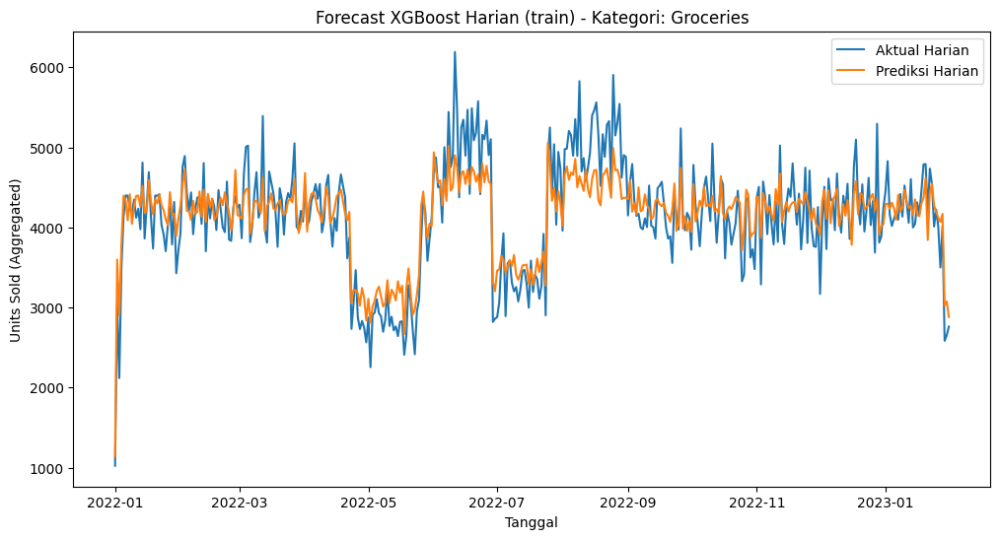

MAE harian kategori Groceries (Test): 321.94 ,MAPE harian kategori Groceries (Test): 8.10%


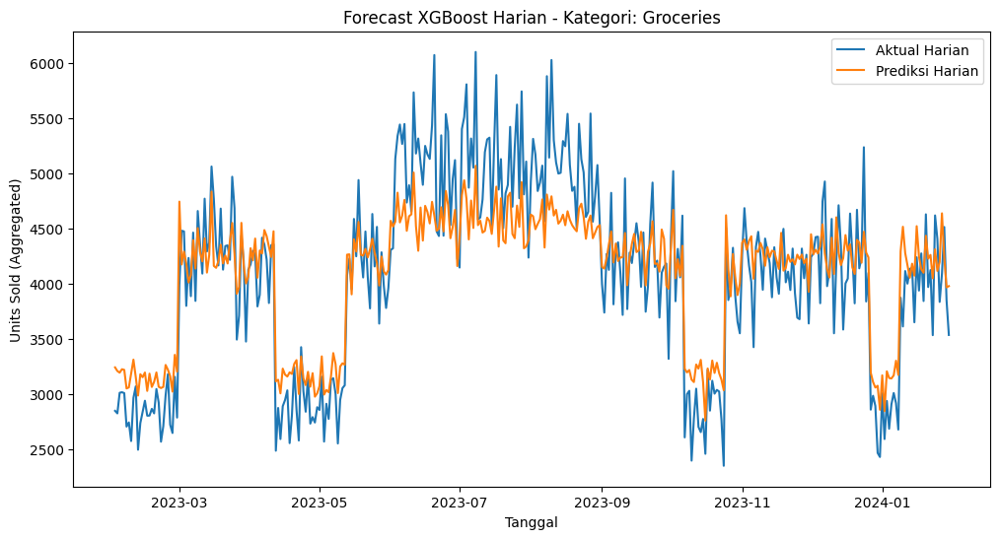


Processing kategori: Furniture
MAE harian kategori Furniture (Train): 90.88 ,MAPE harian kategori Furniture (Train): 8.66%


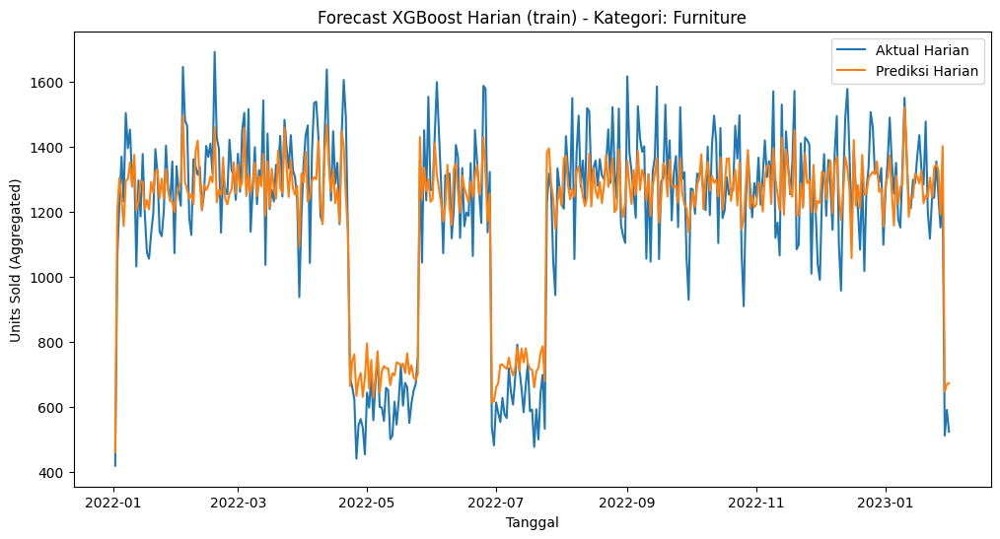

MAE harian kategori Furniture (Test): 96.75 ,MAPE harian kategori Furniture (Test): 10.27%


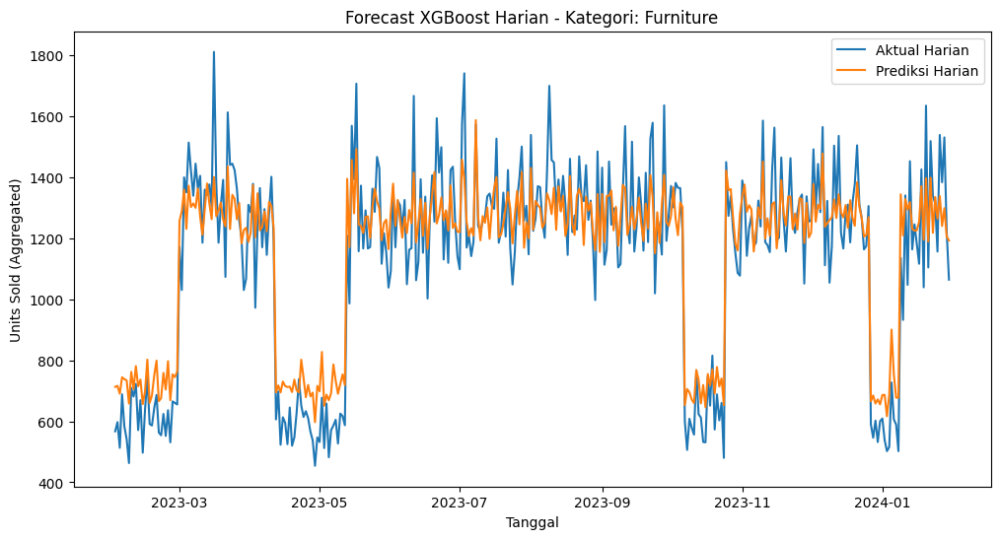


Processing kategori: Clothing
MAE harian kategori Clothing (Train): 104.19 ,MAPE harian kategori Clothing (Train): 6.89%


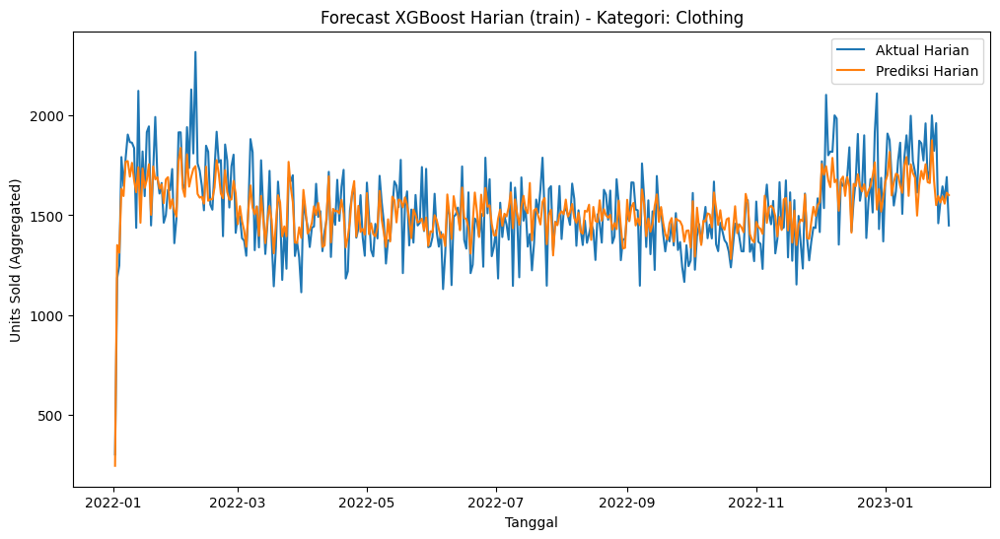

MAE harian kategori Clothing (Test): 111.39 ,MAPE harian kategori Clothing (Test): 7.68%


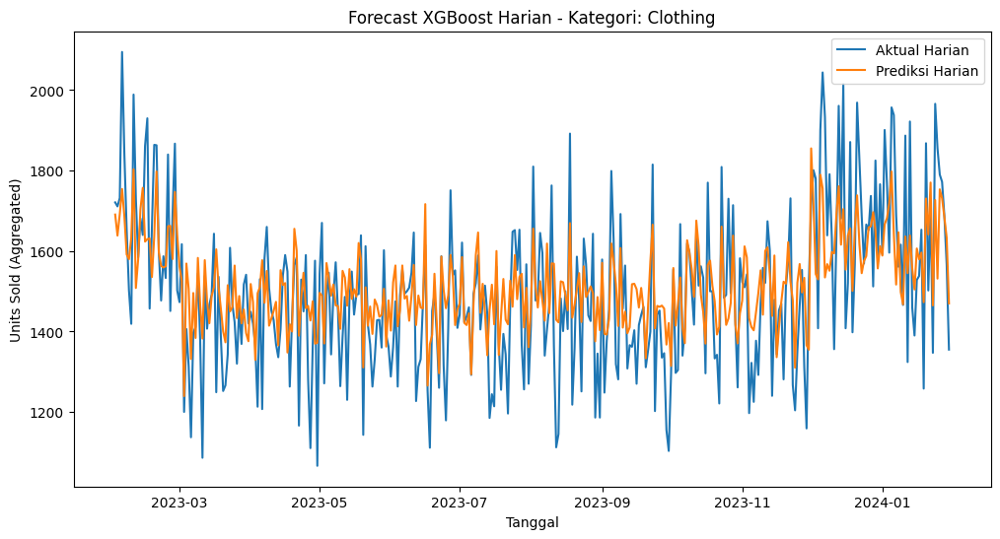


Processing kategori: Toys
MAE harian kategori Toys (Train): 106.20 ,MAPE harian kategori Toys (Train): 11.89%


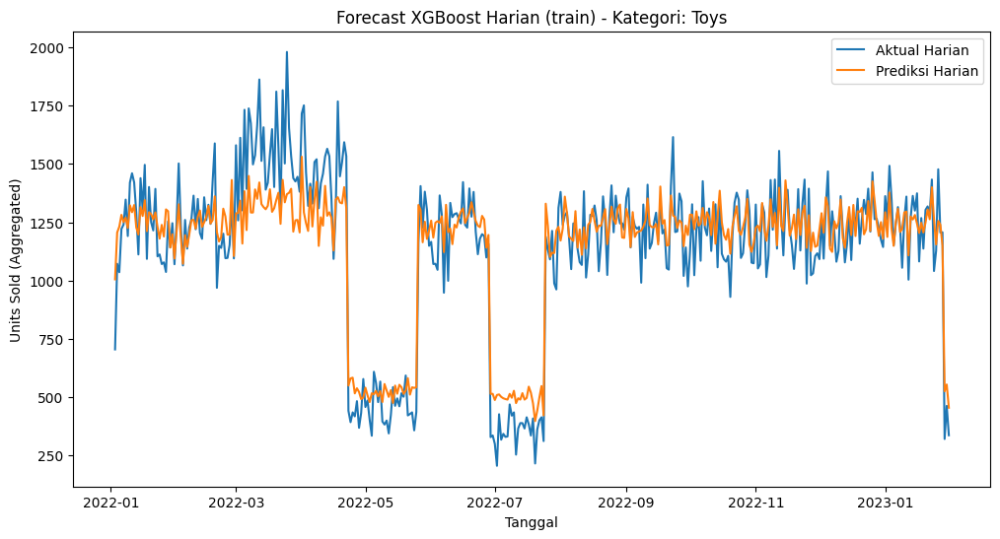

MAE harian kategori Toys (Test): 106.81 ,MAPE harian kategori Toys (Test): 13.04%


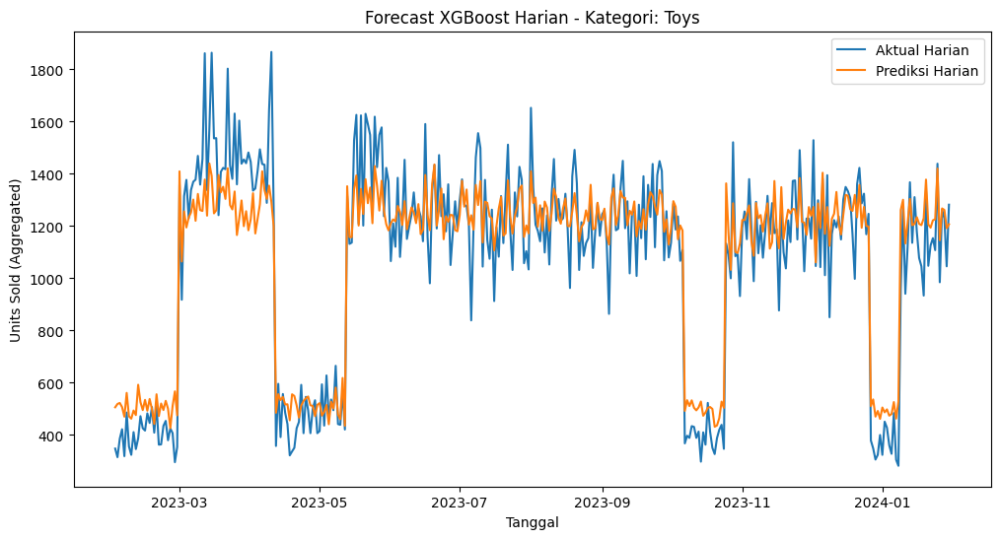


Processing kategori: Electronics
MAE harian kategori Electronics (Train): 89.75 ,MAPE harian kategori Electronics (Train): 9.53%


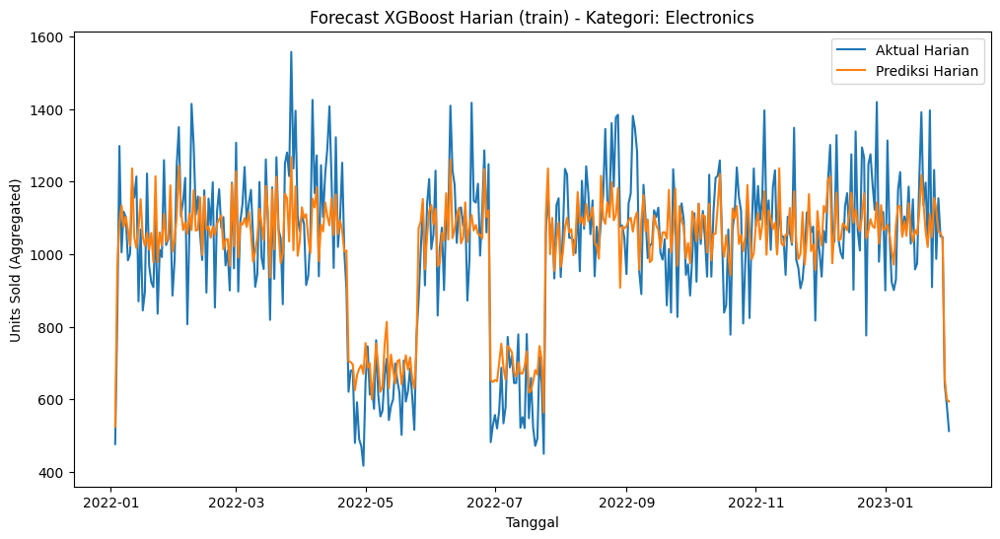

MAE harian kategori Electronics (Test): 81.41 ,MAPE harian kategori Electronics (Test): 8.98%


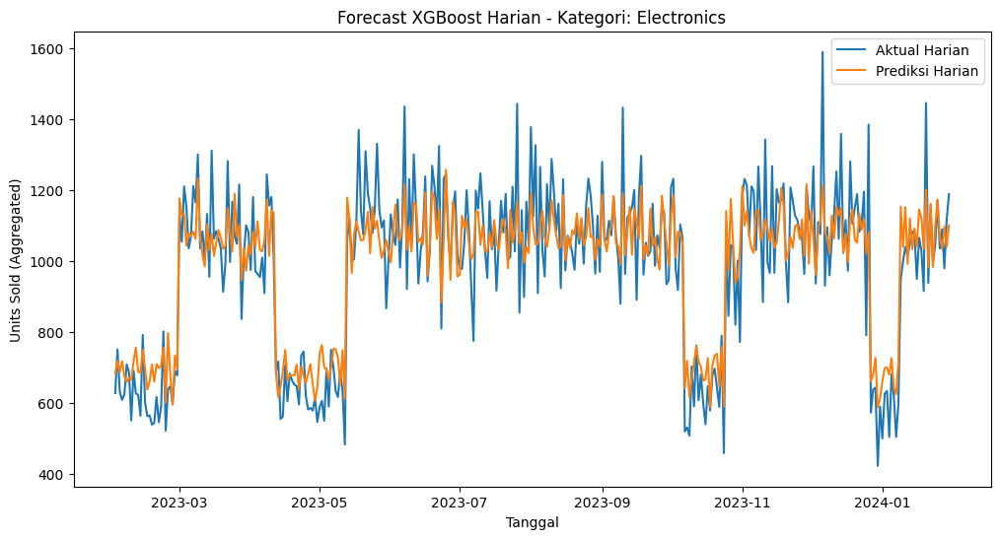

In [ ]:
# Loop untuk semua kategori
for kategori in kategori_list:
    print(f"\nProcessing kategori: {kategori}")

    # Pemisahan data
    df_subset = df_ml[df_ml['Category'] == kategori].copy()
    df_subset = df_subset.sort_values('Date')
    train_data = df_subset[df_subset['Date'] < cutoff]
    test_data = df_subset[df_subset['Date'] >= cutoff].copy()
    test_dates = test_data['Date'].reset_index(drop=True)

    # Memisahkan fitur (X) dan target (y)
    drop_cols = ['Units Sold', 'Date', 'Category', 'Region', 'Store ID', 'Product ID'] # data-data ini tidak digunakan
    X_train = train_data.drop(columns=drop_cols, errors='ignore')
    X_test = test_data.drop(columns=drop_cols, errors='ignore')
    y_train = train_data['Units Sold']
    y_test = test_data['Units Sold']

    # Feature Engineering/encoding
    ordinal_features = ['discount_level', 'price_level']
    for col in ordinal_features:
      le = LabelEncoder()
      X_train[col] = X_train[col].astype(str).fillna('missing')
      X_test[col] = X_test[col].astype(str).fillna('missing')
      X_train[col] = le.fit_transform(X_train[col])
      X_test[col] = le.transform(X_test[col])

    categorical_features = ['Seasonality', 'Weather Condition']
    preprocessor = ColumnTransformer([
      ('onehot', OneHotEncoder(drop='first', handle_unknown='ignore'), categorical_features)
      ], remainder='passthrough')

    # menerapkan preprocessor pada data latih dan data uji
    X_train_encoded = preprocessor.fit_transform(X_train)
    X_test_encoded = preprocessor.transform(X_test)

    # mengubah hasil encoding menjadi DataFrame dan memastikan tipe data float
    X_train_encoded_df = pd.DataFrame(X_train_encoded, columns=preprocessor.get_feature_names_out())
    X_test_encoded_df = pd.DataFrame(X_test_encoded, columns=preprocessor.get_feature_names_out())
    X_train_encoded_df = X_train_encoded_df.astype(float)
    X_test_encoded_df = X_test_encoded_df.astype(float)

    # Pelatihan Model
    model = XGBRegressor(n_estimators=10, learning_rate=0.5, max_depth=1)
    model.fit(X_train_encoded_df, y_train)

    # Prediksi dan Evaluasi Data Train
    y_train_pred = model.predict(X_train_encoded_df)
    train_dates = train_data['Date'].reset_index(drop=True)

    # menggabungkan data aktual dan prediksi harian untuk visualisasi
    train_actuals_df = pd.DataFrame({'Date': train_dates, 'Actual': y_train.values})
    daily_train_actuals = train_actuals_df.groupby('Date')['Actual'].sum().reset_index()
    train_predictions_df = pd.DataFrame({'Date': train_dates, 'Predicted': y_train_pred})
    daily_train_predictions = train_predictions_df.groupby('Date')['Predicted'].sum().reset_index()
    comparison_train_df = pd.merge(daily_train_actuals, daily_train_predictions, on='Date')

    # metrik evaluasi harian dat train
    y_train_agg = comparison_train_df['Actual']
    y_train_pred_agg = comparison_train_df['Predicted']
    mape_train_agg = mape_safe(y_train_agg, y_train_pred_agg)
    mae_train_agg = mean_absolute_error(y_train_agg, y_train_pred_agg)
    print(f"MAE harian kategori {kategori} (Train): {mae_train_agg:.2f} ,MAPE harian kategori {kategori} (Train): {mape_train_agg:.2f}%")

    # visualisasi data train
    plt.figure(figsize=(12, 6))
    sns.lineplot(data=comparison_train_df, x='Date', y='Actual', label='Aktual Harian')
    sns.lineplot(data=comparison_train_df, x='Date', y='Predicted', label='Prediksi Harian')
    plt.title(f"Forecast XGBoost Harian (train) - Kategori: {kategori}")
    plt.xlabel("Tanggal")
    plt.ylabel("Units Sold (Aggregated)")
    plt.legend()
    plt.show()

    # prediksi dan evaluasi data test
    y_pred = model.predict(X_test_encoded_df)
    predictions_df = pd.DataFrame({'Date': test_dates, 'Predicted': y_pred})
    daily_predictions = predictions_df.groupby('Date')['Predicted'].sum().reset_index()
    actuals_df = pd.DataFrame({'Date': test_dates, 'Actual': y_test.values})
    daily_actuals = actuals_df.groupby('Date')['Actual'].sum().reset_index()

    # menyimpan hasil untuk visualisasi dan analisis lebih lanjut
    results_xgb[kategori] = {'actuals': daily_actuals, 'predictions': daily_predictions}
    # gabung data aktual dan prediksi harian untuk data uji
    comparison_df = pd.merge(daily_actuals, daily_predictions, on='Date')

    # metrik evaluasi harian data test
    y_test_agg = comparison_df['Actual']
    y_pred_agg = comparison_df['Predicted']
    mae_agg = mean_absolute_error(y_test_agg, y_pred_agg)
    mape_agg = mape_safe(y_test_agg, y_pred_agg)
    print(f"MAE harian kategori {kategori} (Test): {mae_agg:.2f} ,MAPE harian kategori {kategori} (Test): {mape_agg:.2f}%")
    results.append((kategori, mape_agg, mae_agg))

    # Visualisasi data test
    plt.figure(figsize=(12, 6))
    sns.lineplot(data=comparison_df, x='Date', y='Actual', label='Aktual Harian')
    sns.lineplot(data=comparison_df, x='Date', y='Predicted', label='Prediksi Harian')
    plt.title(f"Forecast XGBoost Harian - Kategori: {kategori}")
    plt.xlabel("Tanggal")
    plt.ylabel("Units Sold (Aggregated)")
    plt.legend()
    plt.show()

# Model SARIMAX

In [ ]:
df_model_sarimax.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 76000 entries, 0 to 75999
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   Date               76000 non-null  datetime64[ns]
 1   Store ID           76000 non-null  object        
 2   Product ID         76000 non-null  object        
 3   Category           76000 non-null  object        
 4   Region             76000 non-null  object        
 5   Inventory Level    76000 non-null  int64         
 6   Units Sold         76000 non-null  int64         
 7   Units Ordered      76000 non-null  int64         
 8   Weather Condition  76000 non-null  object        
 9   Promotion          76000 non-null  int64         
 10  Seasonality        76000 non-null  object        
 11  Epidemic           76000 non-null  int64         
 12  Weekend            76000 non-null  bool          
 13  discount_level     76000 non-null  category      
 14  price_

Model dilakukan dengan segmented per category produk sehingga model akan dijalankan melalui looping, termasuk visualisasi pelatihan data train, prediksi data test, evaluasi metrik, visualisasi residual, dan prediksi future forecast

In [ ]:
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder
from sklearn.compose import ColumnTransformer
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error
from tqdm import tqdm
from pandas.tseries.offsets import Day


# pemilihan exog dan encoding
onehot_features = ['Weather Condition', 'Seasonality']
ordinal_features = ['discount_level', 'price_level']
ordinal_order = [
    ['rendah', 'sedang', 'tinggi'],
    ['murah', 'sedang', 'mahal']
]
exog_passthrough_all = ['Promotion', 'Epidemic', 'Units Ordered', 'Price_Diff', 'dayofweek_sin', 'dayofweek_cos', 'lag_7', 'rolling_mean_7']
exog_cols_all = onehot_features + ordinal_features + exog_passthrough_all

# dictionary untuk menyimpan hasil preprocessing per kategori
preprocessor_dict = {}
# menyimpan fitur eksogen (X)
X_cat_list = {}
# menyimpan variabel target (y)
y_cat_list = {}
# tanggal batas untuk pemisahan data train/test
split_date = '2023-02-01'

df_model_sarimax['Date'] = pd.to_datetime(df_model_sarimax['Date'])
# atur date menjadi index
df_model_sarimax = df_model_sarimax.set_index('Date').sort_index()

# preprocessing per category
# loop untuk memproses setiap kategori produk secara terpisah
for cat in tqdm(df_model_sarimax['Category'].unique()):
    subset = df_model_sarimax[df_model_sarimax['Category'] == cat].copy()
    # Membuat fitur tanggal (day of week)
    subset['dayofweek'] = subset.index.dayofweek
    subset['dayofweek_sin'] = np.sin(2 * np.pi * subset['dayofweek'] / 7)
    subset['dayofweek_cos'] = np.cos(2 * np.pi * subset['dayofweek'] / 7)

    # menentukan kolom numerik dan kategorikal yang akan diagregasi
    numerik_cols_to_agg = [col for col in ['Units Sold'] + exog_passthrough_all if col in subset.columns and subset[col].dtype != 'object']
    kategorikal_cols_to_agg = onehot_features + ordinal_features

    # Mengagregasi data numerik per hari
    numerik_agg = subset[['Units Sold']].groupby(subset.index).sum()
    numerik_agg = numerik_agg.asfreq('D').fillna(0)

    # buat fitur lag dan rolling mean
    numerik_agg['lag_7'] = numerik_agg['Units Sold'].shift(7).fillna(0)
    numerik_agg['rolling_mean_7'] = numerik_agg['Units Sold'].rolling(window=7, min_periods=1).mean().fillna(0)

    # agregasi fitur numerik passthrough
    for col in [c for c in exog_passthrough_all if c in subset.columns]:
        if subset[col].dtype != 'object':
            numerik_agg[col] = subset[[col]].groupby(subset.index).mean().reindex(numerik_agg.index).ffill().bfill()

    # agregasi data kategorikal per hari
    kategorikal_agg = pd.DataFrame(index=numerik_agg.index)
    for col in kategorikal_cols_to_agg:
        if col in subset.columns:
            mode_val = subset[[col]].groupby(subset.index).agg(lambda x: x.mode()[0] if not x.mode().empty else 'Unknown')
            kategorikal_agg[col] = mode_val.reindex(numerik_agg.index).ffill().bfill()

    # menggabungkan data numerik dan kategorikal yang sudah diagregasi
    aggregated_df = pd.concat([numerik_agg, kategorikal_agg], axis=1)

    # memeriksa apakah data historis cukup (minimal 12 bulan atau 365 hari)
    y = aggregated_df['Units Sold']
    if len(y) < 365:
        print(f"Skip {cat} -> Data kurang dari 12 bulan: {len(y)} hari")
        continue
    # encoding fitur eksogen
    try:
        X_exog_raw = aggregated_df[exog_cols_all].copy()
        preprocessor = ColumnTransformer(transformers=[
            ('ord', OrdinalEncoder(categories=ordinal_order), ordinal_features),
            ('ohe', OneHotEncoder(drop='first', handle_unknown='ignore'), onehot_features)
        ], remainder='passthrough')

        # melatih preprocessor pada seluruh data historis
        preprocessor.fit(X_exog_raw)
        preprocessor_dict[cat] = preprocessor

        X_encoded = preprocessor.transform(X_exog_raw)
        # nama kolom baru setelah one-hot encoding
        encoded_ohe = preprocessor.named_transformers_['ohe'].get_feature_names_out(onehot_features).tolist()
        final_exog_cols = ordinal_features + encoded_ohe + exog_passthrough_all
        # ubah hasil encoding menjadi DataFrame
        X_exog_ready = pd.DataFrame(X_encoded, columns=final_exog_cols, index=X_exog_raw.index).fillna(0)

        # menyimpan data ke dictionary
        X_cat_list[cat] = X_exog_ready
        y_cat_list[cat] = y
    except Exception as e:
        print(f"Category {cat} gagal encoding: {e}")
        continue

100%|██████████| 5/5 [00:04<00:00,  1.17it/s]


  0%|          | 0/5 [00:00<?, ?it/s]

Melatih model untuk kategori: Electronics dengan order=(1, 1, 1), seasonal_order=(1, 0, 0, 7)


/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Analisis residu untuk kategori: Electronics


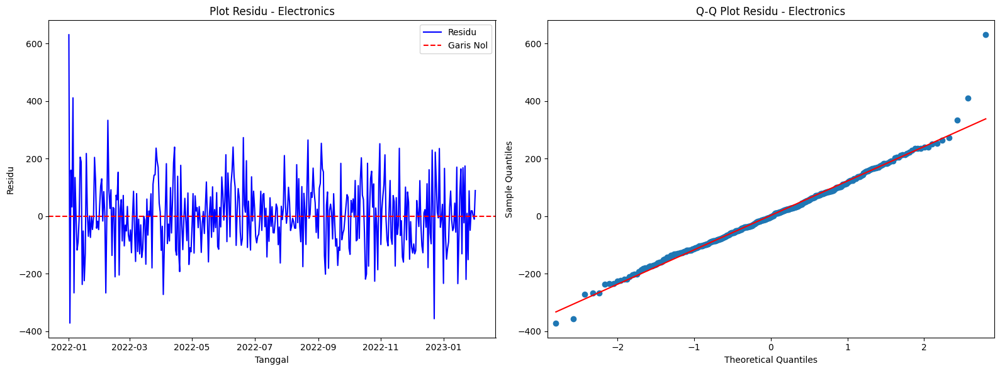

Electronics → TRAIN (MAE: 93.02, MAPE: 9.40%) | TEST (MAE: 100.71, MAPE: 10.68%)


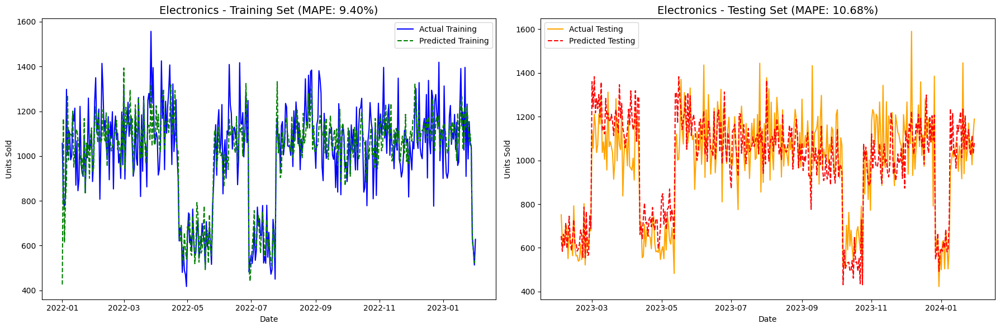

Melatih model produksi untuk kategori: Electronics dengan order=(1, 1, 1), seasonal_order=(1, 1, 1, 7)


/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/tmp/ipython-input-1569299314.py:242: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  X_future_final = pd.DataFrame(X_future_encoded, index=X_future_raw.index, columns=future_exog_cols).fillna(0)


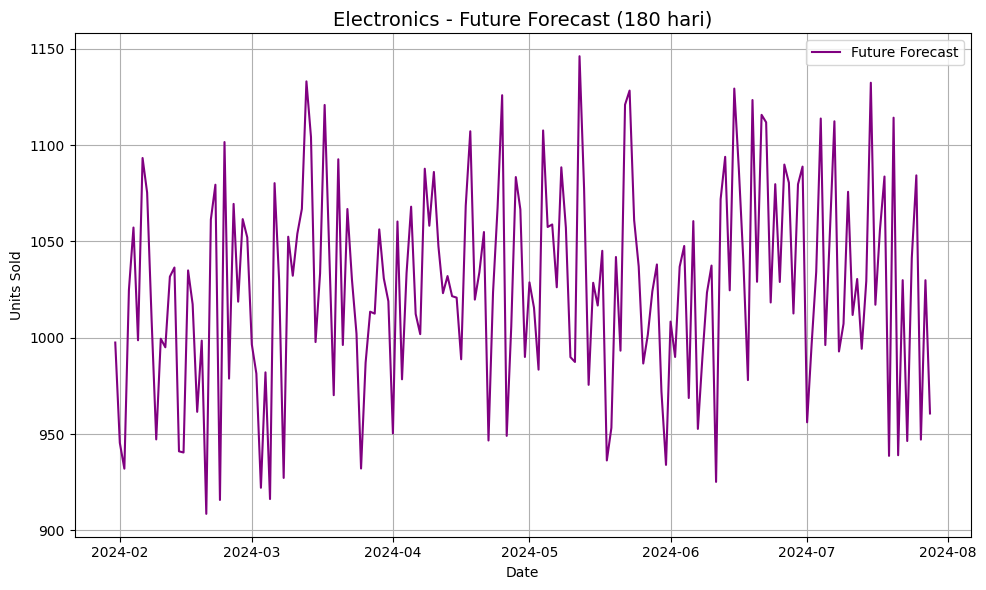

 20%|██        | 1/5 [00:13<00:52, 13.17s/it]

Electronics -> Berhasil memprediksi 180 hari ke depan.
Melatih model untuk kategori: Clothing dengan order=(1, 1, 1), seasonal_order=(1, 0, 0, 7)


/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Analisis residu untuk kategori: Clothing


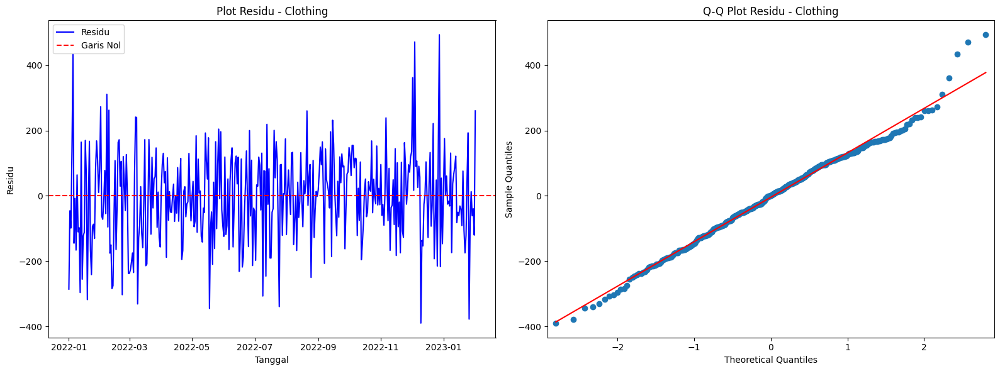

Clothing → TRAIN (MAE: 108.25, MAPE: 7.17%) | TEST (MAE: 121.34, MAPE: 8.47%)


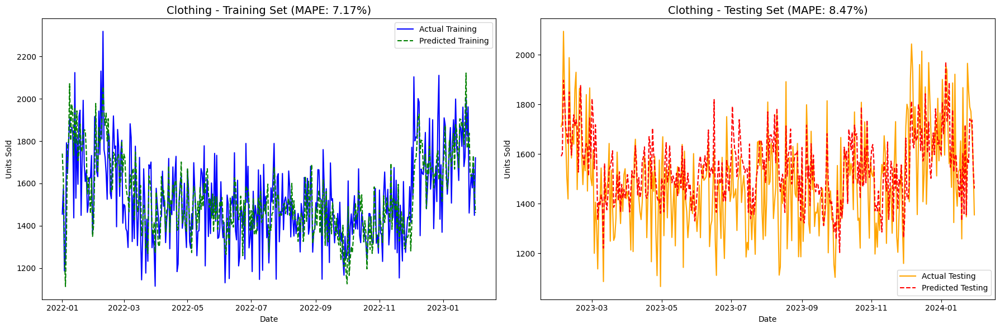

Melatih model produksi untuk kategori: Clothing dengan order=(2, 0, 1), seasonal_order=(1, 1, 0, 7)


/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/tmp/ipython-input-1569299314.py:242: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  X_future_final = pd.DataFrame(X_future_encoded, index=X_future_raw.index, columns=future_exog_cols).fillna(0)


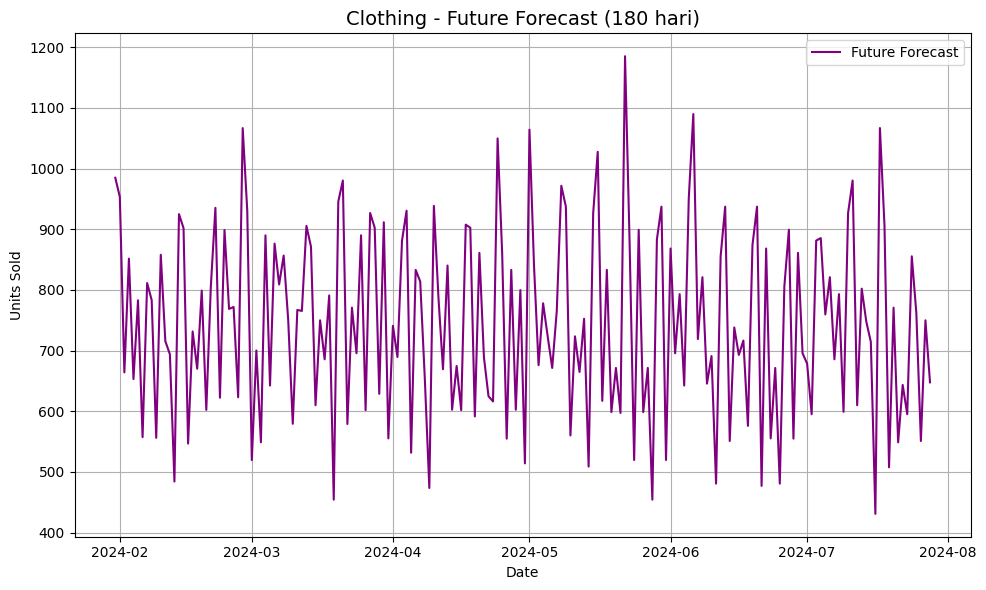

 40%|████      | 2/5 [00:27<00:41, 13.99s/it]

Clothing -> Berhasil memprediksi 180 hari ke depan.
Melatih model untuk kategori: Groceries dengan order=(1, 1, 1), seasonal_order=(1, 0, 0, 7)


/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Analisis residu untuk kategori: Groceries


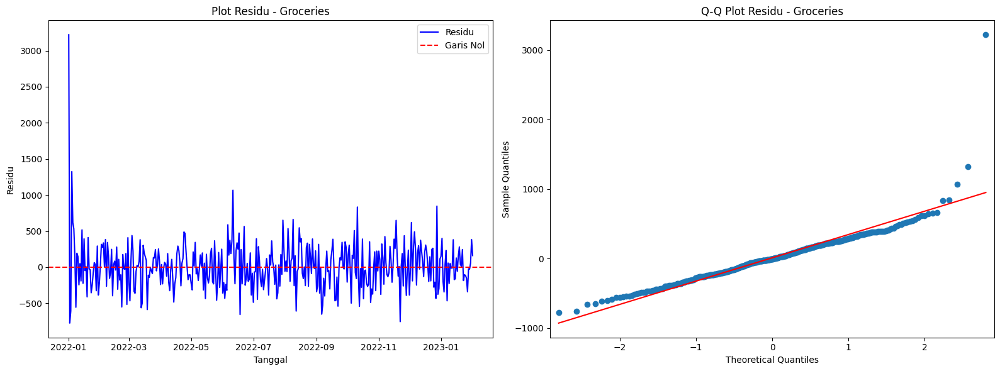

Groceries → TRAIN (MAE: 238.35, MAPE: 5.90%) | TEST (MAE: 290.79, MAPE: 7.45%)


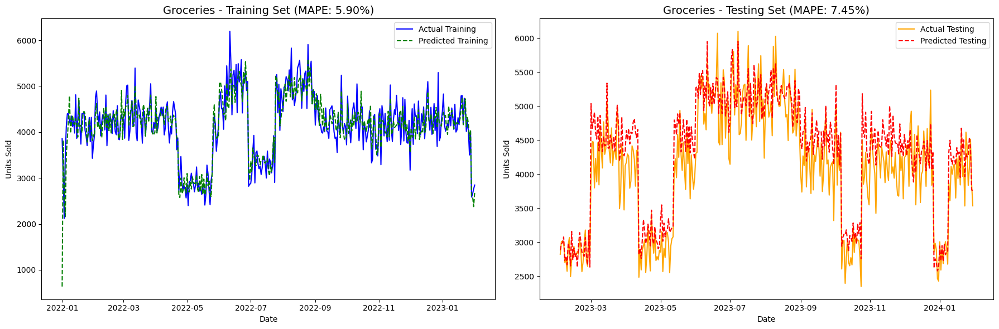

Melatih model produksi untuk kategori: Groceries dengan order=(1, 1, 1), seasonal_order=(1, 1, 1, 7)


/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/tmp/ipython-input-1569299314.py:242: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  X_future_final = pd.DataFrame(X_future_encoded, index=X_future_raw.index, columns=future_exog_cols).fillna(0)


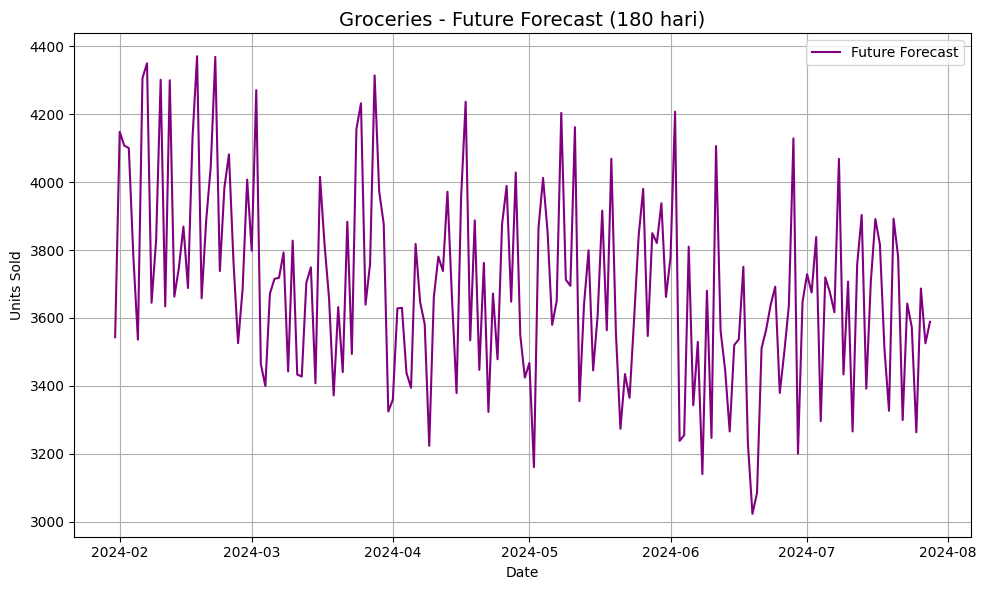

 60%|██████    | 3/5 [00:41<00:27, 13.71s/it]

Groceries -> Berhasil memprediksi 180 hari ke depan.
Melatih model untuk kategori: Toys dengan order=(2, 1, 1), seasonal_order=(1, 1, 0, 7)


/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Analisis residu untuk kategori: Toys


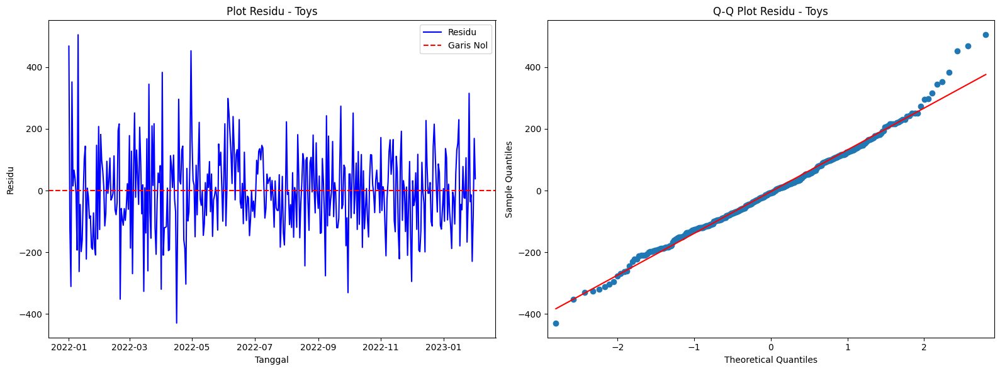

Toys → TRAIN (MAE: 105.39, MAPE: 10.77%) | TEST (MAE: 123.32, MAPE: 14.74%)


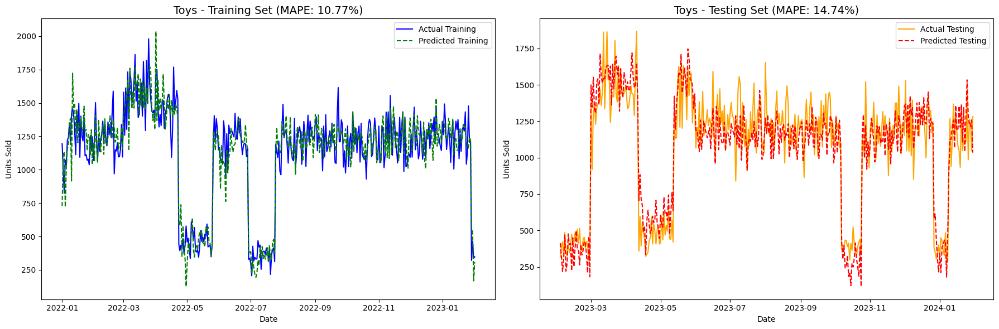

Melatih model produksi untuk kategori: Toys dengan order=(2, 1, 1), seasonal_order=(1, 0, 1, 7)


/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/tmp/ipython-input-1569299314.py:242: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  X_future_final = pd.DataFrame(X_future_encoded, index=X_future_raw.index, columns=future_exog_cols).fillna(0)


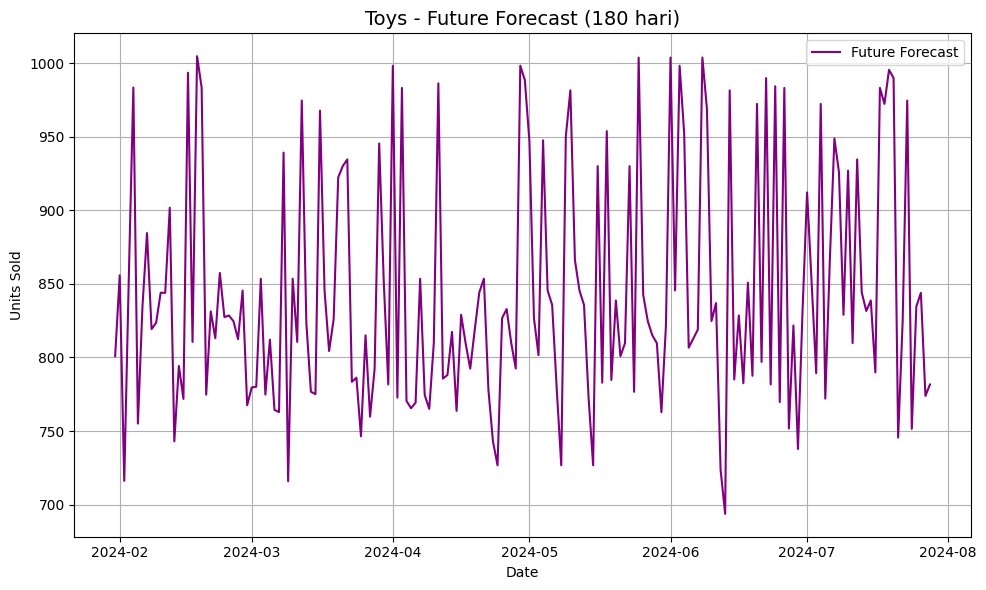

 80%|████████  | 4/5 [00:56<00:14, 14.48s/it]

Toys -> Berhasil memprediksi 180 hari ke depan.
Melatih model untuk kategori: Furniture dengan order=(1, 0, 1), seasonal_order=(1, 0, 0, 7)
Analisis residu untuk kategori: Furniture


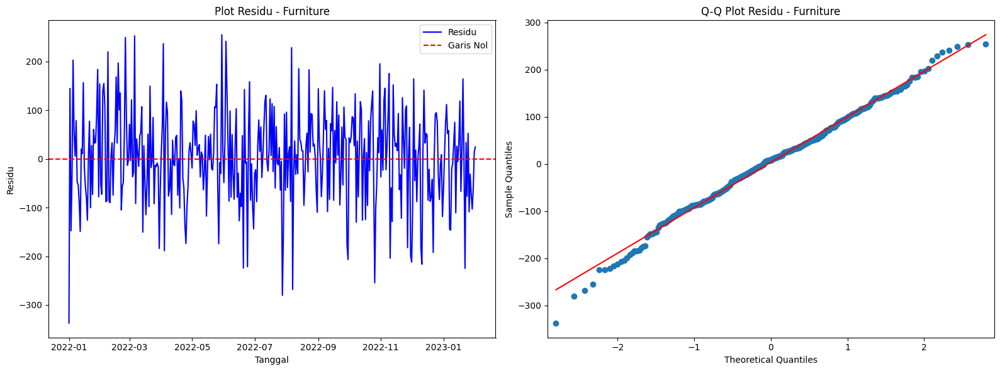

Furniture → TRAIN (MAE: 75.27, MAPE: 6.71%) | TEST (MAE: 83.54, MAPE: 7.84%)


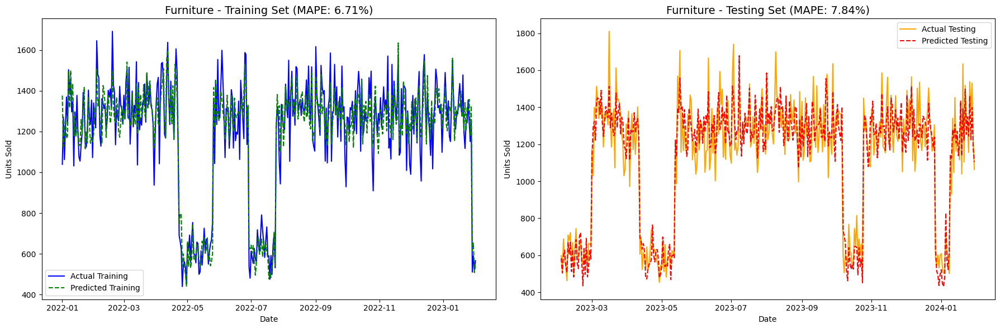

Melatih model produksi untuk kategori: Furniture dengan order=(1, 0, 1), seasonal_order=(1, 0, 0, 7)


/tmp/ipython-input-1569299314.py:242: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  X_future_final = pd.DataFrame(X_future_encoded, index=X_future_raw.index, columns=future_exog_cols).fillna(0)


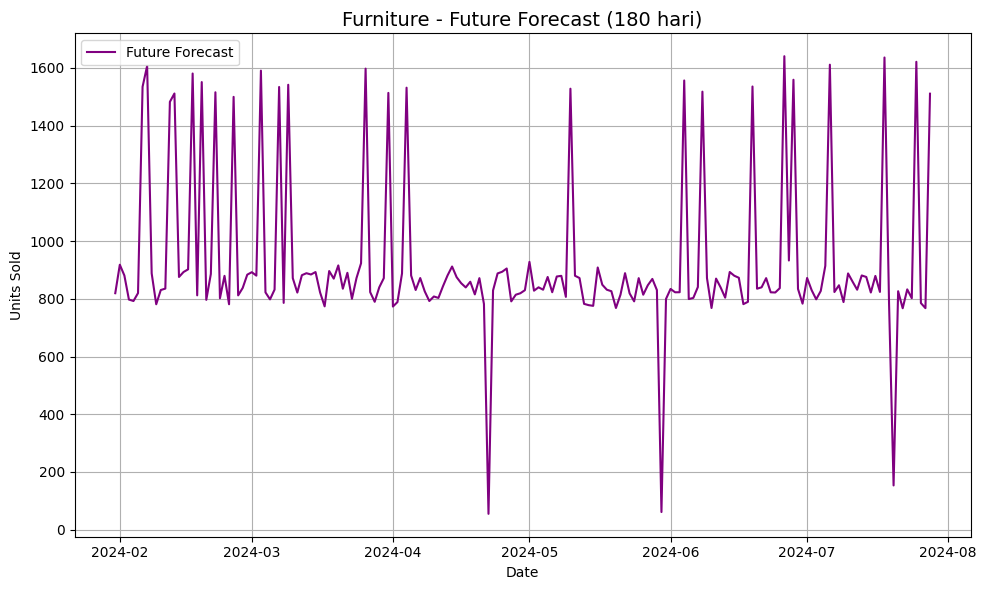

100%|██████████| 5/5 [01:06<00:00, 13.36s/it]

Furniture -> Berhasil memprediksi 180 hari ke depan.


In [ ]:
import pandas as pd
import numpy as np
from tqdm import tqdm
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error
from statsmodels.graphics.gofplots import qqplot
import matplotlib.pyplot as plt
from collections import Counter

# frekuensi historis untuk setiap kategori
# ini digunakan untuk mensimulasikan data eksogen masa depan berdasarkan distribusi historis
frequency_dict = {}
for cat in df_model_sarimax['Category'].unique():
    subset = df_model_sarimax[df_model_sarimax['Category'] == cat].copy()
    cat_freq = {}
    for col in onehot_features + ordinal_features:
        if col in subset.columns:
            # Menghitung frekuensi setiap nilai kategorikal
            value_counts = subset[col].value_counts(normalize=True).to_dict()
            cat_freq[col] = value_counts
    frequency_dict[cat] = cat_freq


# PELATIHAN, PREDIKSI, DAN EVALUASI
# menyimpan evaluasi metrik
eval_dict = {}
# Menyimpan hasil prediksi pada data test
results_sarimax = {}
# Menyimpan hasil prediksi masa depan/future forecast
forecast_future_dict = {}
# jumlah hari untuk prediksi masa depan (6 bulan)
future_days = 180
# hasil evaluasi prediksi pada data test
forecast_eval_dict = {}
final_models = {}


# loop utama untuk setiap kategori yang tersedia
for cat in tqdm(X_cat_list.keys()):
    X_hist = X_cat_list[cat].sort_index()
    y_hist = y_cat_list[cat].sort_index()

    # split data train dan data test
    y_train = y_hist[y_hist.index <= split_date]
    y_test = y_hist[y_hist.index > split_date]
    X_train = X_hist.loc[y_train.index]
    X_test = X_hist.loc[y_test.index]

    # lewati kategori jika data terlalu sedikit untuk dianalisis
    if len(y_train) < 30 or len(y_test) < 1:
        eval_dict[cat] = {'Status': 'Skipped', 'Alasan': 'Data terlalu sedikit'}
        print(f"Skip {cat} -> data historis tidak cukup untuk evaluasi.")
        continue

    try:
        #  kustomisasi spesifik per category
        if cat == 'Furniture':
            order_param = (1, 0, 1)
            seasonal_order_param = (1, 0, 0, 7)
            exog_train = X_train
            exog_test = X_test
        elif cat == 'Clothing':
            order_param = (1, 1, 1)
            seasonal_order_param = (1, 0, 0, 7)
            exog_train = X_train
            exog_test = X_test
        elif cat == 'Groceries':
            order_param = (1, 1, 1)
            seasonal_order_param = (1, 0, 0, 7)
            exog_to_remove = ['lag_7', 'rolling_mean_7']
            exog_train = X_train.drop(columns=[c for c in exog_to_remove if c in X_train.columns], errors='ignore')
            exog_test = X_test.drop(columns=[c for c in exog_to_remove if c in X_test.columns], errors='ignore')
        elif cat == 'Toys':
            order_param = (2, 1, 1)
            seasonal_order_param = (1, 1, 0, 7)
            exog_train = X_train
            exog_test = X_test
        elif cat == 'Electronics':
            order_param = (1, 1, 1)
            seasonal_order_param = (1, 0, 0, 7)
            exog_to_remove = ['lag_7', 'rolling_mean_7']
            exog_train = X_train.drop(columns=[c for c in exog_to_remove if c in X_train.columns], errors='ignore')
            exog_test = X_test.drop(columns=[c for c in exog_to_remove if c in X_test.columns], errors='ignore')

        print(f"Melatih model untuk kategori: {cat} dengan order={order_param}, seasonal_order={seasonal_order_param}")

        # pelatihan data train
        model_eval = SARIMAX(
            endog=y_train.astype(float),
            exog=exog_train.astype(float),
            order=order_param,
            seasonal_order=seasonal_order_param,
            enforce_stationarity=False,
            enforce_invertibility=False
        )
        result_eval = model_eval.fit(disp=False)

        #  analisis Residu
        print(f"Analisis residu untuk kategori: {cat}")
        resid = result_eval.resid
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
        # plot residu terhadap waktu
        ax1.plot(resid.index, resid, label='Residu', color='blue')
        ax1.axhline(y=0, color='red', linestyle='--', label='Garis Nol')
        ax1.set_title(f'Plot Residu - {cat}')
        ax1.set_xlabel('Tanggal')
        ax1.set_ylabel('Residu')
        ax1.legend()
        # Q-Q plot
        qqplot(resid, line='s', ax=ax2)
        ax2.set_title(f'Q-Q Plot Residu - {cat}')

        plt.tight_layout()
        plt.show()

        # prediksi dan evaluasi pada data train
        y_pred_train = result_eval.predict(start=y_train.index[0], end=y_train.index[-1], exog=exog_train.astype(float))
        mae_train = mean_absolute_error(y_train, y_pred_train)
        mape_train = mean_absolute_percentage_error(y_train, y_pred_train)

        # prediksi dan evaluasi pada data test
        y_pred_test = result_eval.predict(start=y_test.index[0], end=y_test.index[-1], exog=exog_test.astype(float))
        mae_test = mean_absolute_error(y_test, y_pred_test)
        mape_test = mean_absolute_percentage_error(y_test, y_pred_test)

        # simpan hasil prediksi data uji untuk visualisasi
        daily_actuals_sarimax = pd.DataFrame({'Date': y_test.index, 'Actual': y_test.values})
        daily_predictions_sarimax = pd.DataFrame({'Date': y_test.index, 'Predicted': y_pred_test.values})

        results_sarimax[cat] = {'actuals': daily_actuals_sarimax, 'predictions': daily_predictions_sarimax}
        forecast_eval_dict[cat] = pd.DataFrame({
            'date': y_test.index,
            'actual': y_test.values,
            'forecast': y_pred_test.values
        })
        # simpan metrik evaluasi
        eval_dict[cat] = {'MAE_train': mae_train, 'MAPE_train': mape_train, 'MAE_test': mae_test, 'MAPE_test': mape_test}
        print(f"{cat} → TRAIN (MAE: {mae_train:.2f}, MAPE: {mape_train:.2%}) | TEST (MAE: {mae_test:.2f}, MAPE: {mape_test:.2%})")

        # Grafik untuk Training dan Testing Set
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6))

        ax1.set_title(f'{cat} - Training Set (MAPE: {mape_train:.2%})', fontsize=14)
        ax1.plot(y_train.index, y_train.values, label='Actual Training', color='blue')
        ax1.plot(y_pred_train.index, y_pred_train.values, label='Predicted Training', color='green', linestyle='--')
        ax1.legend()
        ax1.set_xlabel('Date')
        ax1.set_ylabel('Units Sold')

        ax2.set_title(f'{cat} - Testing Set (MAPE: {mape_test:.2%})', fontsize=14)
        ax2.plot(y_test.index, y_test.values, label='Actual Testing', color='orange')
        ax2.plot(y_pred_test.index, y_pred_test.values, label='Predicted Testing', color='red', linestyle='--')
        ax2.legend()
        ax2.set_xlabel('Date')
        ax2.set_ylabel('Units Sold')

        plt.tight_layout()
        plt.show()

        # kustomisasi spesifik untuk future forecast
        if cat == 'Furniture':
          order_param_prod = (1, 0, 1)
          seasonal_order_param_prod = (1, 0, 0, 7)
          exog_prod = X_hist
          exog_to_remove_prod = []
        elif cat == 'Clothing':
          order_param_prod = (2, 0, 1)
          seasonal_order_param_prod = (1, 1, 0, 7)
          exog_prod = X_hist
          exog_to_remove_prod = []
        elif cat == 'Groceries':
          order_param_prod = (1, 1, 1)
          seasonal_order_param_prod = (1, 1, 1, 7)
          exog_to_remove_prod = ['lag_7', 'rolling_mean_7']
          exog_prod = X_hist.drop(columns=[c for c in exog_to_remove_prod if c in X_hist.columns], errors='ignore')
        elif cat == 'Toys':
          order_param_prod = (2, 1, 1)
          seasonal_order_param_prod = (1, 0, 1, 7)
          exog_prod = X_hist
          exog_to_remove_prod = []
        elif cat == 'Electronics':
          order_param_prod = (1, 1, 1)
          seasonal_order_param_prod = (1, 1, 1, 7)
          exog_to_remove_prod = ['lag_7', 'rolling_mean_7']
          exog_prod = X_hist.drop(columns=[c for c in exog_to_remove_prod if c in X_hist.columns], errors='ignore')

        print(f"Melatih model produksi untuk kategori: {cat} dengan order={order_param_prod}, seasonal_order={seasonal_order_param_prod}")

        # Model future forecast
        model_prod = SARIMAX(
          endog=y_hist.astype(float),
          exog=exog_prod.astype(float),
          order=order_param_prod,
          seasonal_order=seasonal_order_param_prod,
          enforce_stationarity=False,
          enforce_invertibility=False
          )

        result_prod = model_prod.fit(disp=False)
        preprocessor = preprocessor_dict[cat]
        # Simpan objek model dan preprocessor ke dalam dictionary
        final_models[cat] = {
            'model': result_prod,
            'preprocessor': preprocessor_dict[cat]
        }

        start_future_date = y_hist.index.max() + pd.Timedelta(days=1)
        future_index = pd.date_range(start=start_future_date, periods=future_days, freq='D')
        # buat dataframe kosong untuk fitur eksogen masa depan(future)
        X_future_raw = pd.DataFrame(index=future_index, columns=exog_cols_all)

        current_cat_freq = frequency_dict[cat]
        current_subset = df_model_sarimax[df_model_sarimax['Category'] == cat].copy()

        # mengisi fitur eksogen masa depan dengan data simulasi/default
        for col in X_future_raw.columns:
            if col in onehot_features + ordinal_features:
                col_freq = current_cat_freq.get(col, {})
                if col_freq:
                    values = list(col_freq.keys())
                    probabilities = list(col_freq.values())
                    simulated_values = np.random.choice(values, size=len(future_index), p=probabilities)
                    X_future_raw[col] = simulated_values
                else:
                    X_future_raw[col] = current_subset[col].mode()[0]
            elif col in ['Promotion', 'Epidemic']:
                X_future_raw[col] = 0
            elif col in ['Units Ordered', 'Price_Diff']:
                X_future_raw[col] = current_subset[col].mean()
            elif col == 'dayofweek_sin':
                X_future_raw[col] = np.sin(2 * np.pi * X_future_raw.index.dayofweek / 7)
            elif col == 'dayofweek_cos':
                X_future_raw[col] = np.cos(2 * np.pi * X_future_raw.index.dayofweek / 7)

        # menerapkan preprocessor yang sudah dilatih
        X_future_encoded = preprocessor.transform(X_future_raw)
        # nama kolom yang tepat setelah encoding
        future_exog_cols = list(preprocessor.named_transformers_['ord'].get_feature_names_out(ordinal_features)) + \
            list(preprocessor.named_transformers_['ohe'].get_feature_names_out(onehot_features)) + \
            [col for col in exog_passthrough_all if col not in ordinal_features + onehot_features]

        X_future_final = pd.DataFrame(X_future_encoded, index=X_future_raw.index, columns=future_exog_cols).fillna(0)
        # hapus kolom eksogen yang tidak relevan dengan model future
        if exog_to_remove_prod:
            X_future_final = X_future_final.drop(columns=[c for c in exog_to_remove_prod if c in X_future_final.columns], errors='ignore')

        # Prediksi Masa Depan (future)
        forecast_result = result_prod.get_forecast(steps=future_days, exog=X_future_final.astype(float))
        forecast_original = forecast_result.predicted_mean

        forecast_future_df = pd.DataFrame({'forecast': forecast_original})

        # Grafik baru untuk prediksi masa depan
        plt.figure(figsize=(10, 6))
        plt.title(f'{cat} - Future Forecast ({future_days} hari)', fontsize=14)
        plt.plot(forecast_future_df.index, forecast_future_df['forecast'], label='Future Forecast', color='purple')
        plt.xlabel('Date')
        plt.ylabel('Units Sold')
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()
        # simpan hasil prediksi
        forecast_future_dict[cat] = forecast_future_df[['forecast']]
        print(f"{cat} -> Berhasil memprediksi {future_days} hari ke depan.")

    except Exception as e:
        eval_dict[cat] = {'Status': 'Failed', 'Reason': str(e)}
        print(f"Gagal modeling/forecasting {cat}: {e}")
        continue


Membuat visualisasi perbandingan untuk kategori: Electronics
Perbandingan MAPE untuk Kategori Electronics:
- XGBoost MAPE: 8.98%
- SARIMAX MAPE: 10.68%


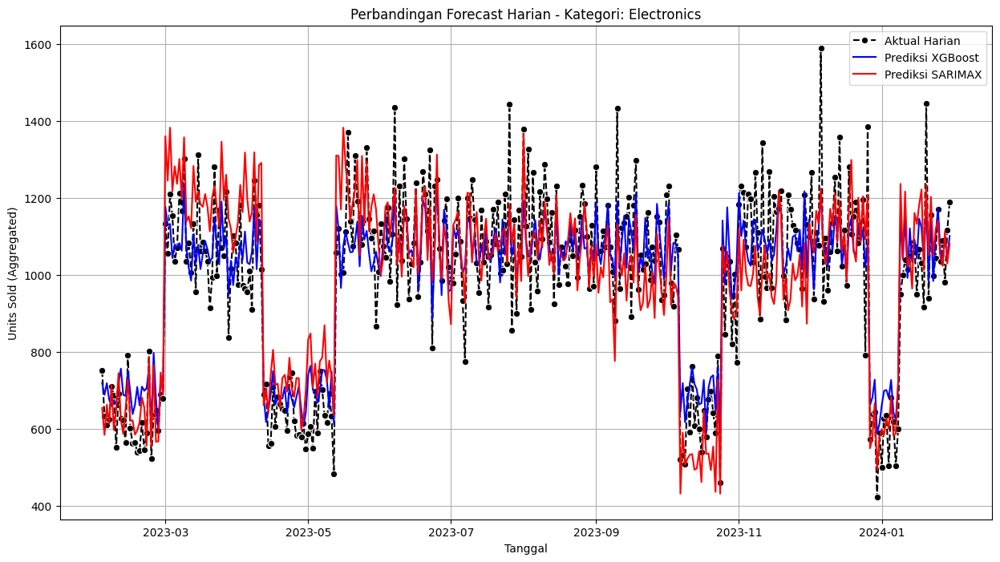


Membuat visualisasi perbandingan untuk kategori: Groceries
Perbandingan MAPE untuk Kategori Groceries:
- XGBoost MAPE: 8.08%
- SARIMAX MAPE: 7.48%


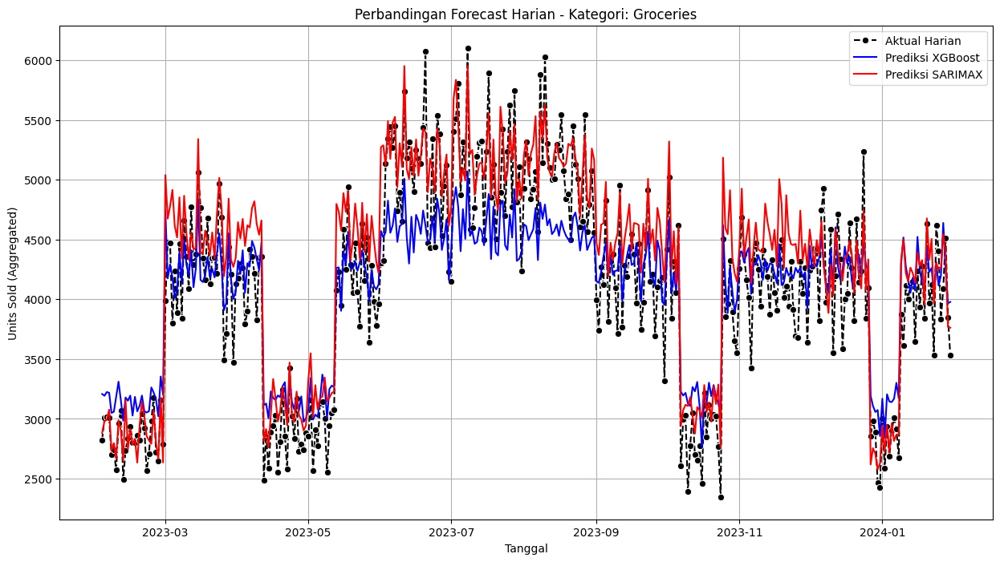


Membuat visualisasi perbandingan untuk kategori: Furniture
Perbandingan MAPE untuk Kategori Furniture:
- XGBoost MAPE: 10.23%
- SARIMAX MAPE: 7.82%


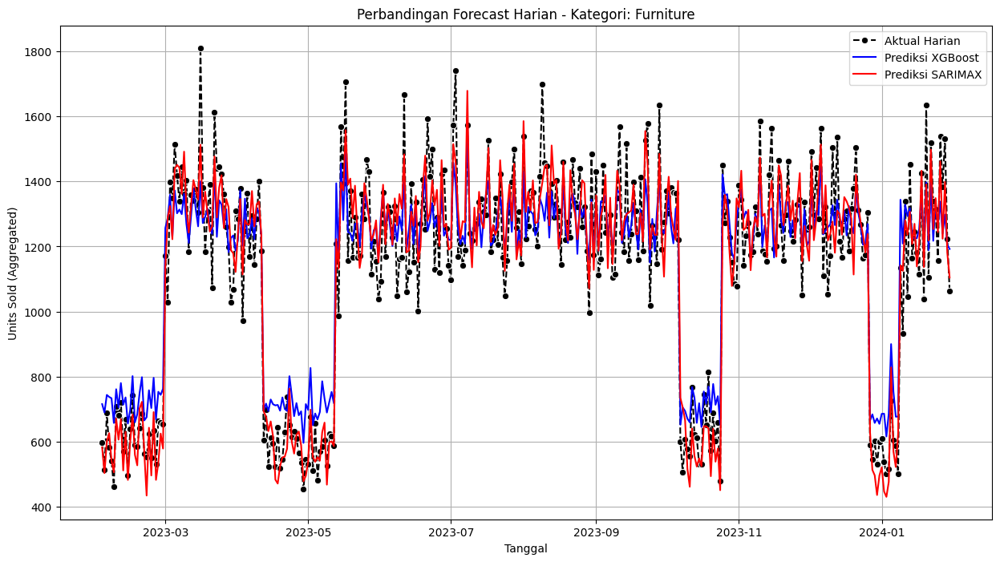


Membuat visualisasi perbandingan untuk kategori: Toys
Perbandingan MAPE untuk Kategori Toys:
- XGBoost MAPE: 12.95%
- SARIMAX MAPE: 14.74%


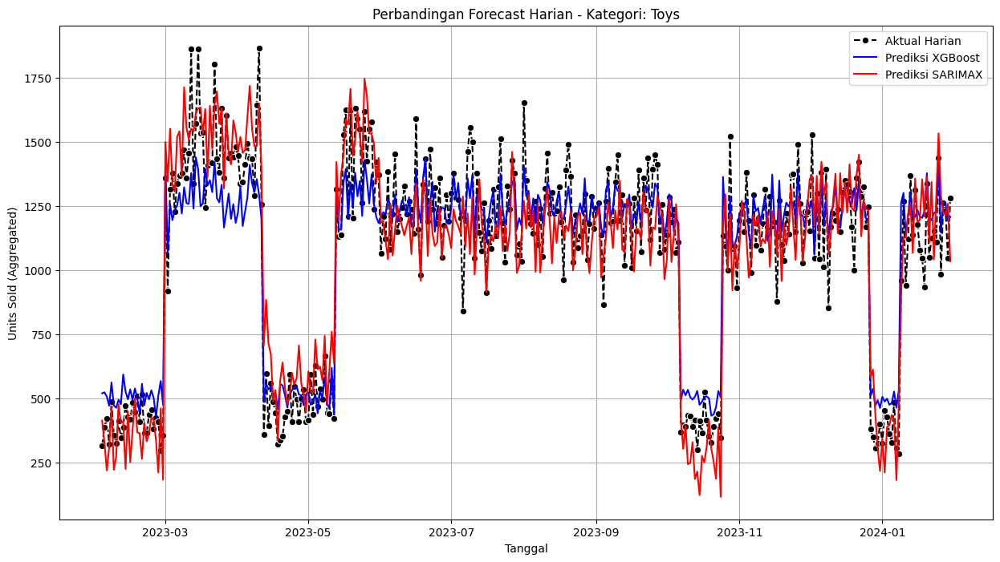


Membuat visualisasi perbandingan untuk kategori: Clothing
Perbandingan MAPE untuk Kategori Clothing:
- XGBoost MAPE: 7.70%
- SARIMAX MAPE: 8.49%


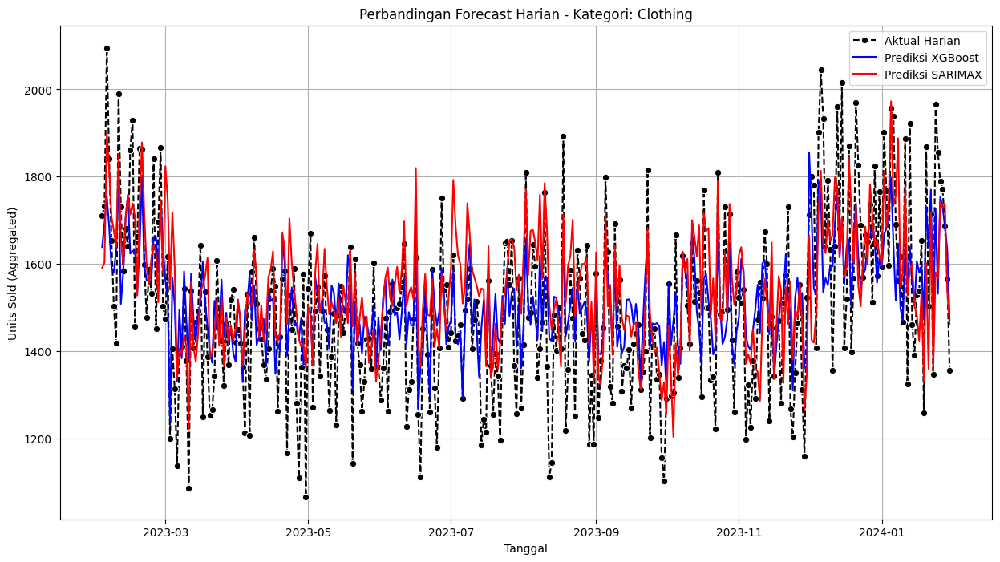

In [ ]:
kategori_list_to_plot = list(set(results_xgb.keys()) & set(results_sarimax.keys()))

if not kategori_list_to_plot:
    print("Tidak ada kategori yang tersedia di kedua hasil model untuk perbandingan.")
else:
    for kategori in kategori_list_to_plot:
        print(f"\nMembuat visualisasi perbandingan untuk kategori: {kategori}")

        # Ambil data dari dictionary
        actuals_df = results_xgb[kategori]['actuals'].copy()
        predictions_xgb_df = results_xgb[kategori]['predictions'].copy()
        predictions_sarimax_df = results_sarimax[kategori]['predictions'].copy()


        # Ganti nama kolom prediksi agar unik sebelum digabungkan
        predictions_xgb_df = predictions_xgb_df.rename(columns={'Predicted': 'Predicted_XGB'})
        predictions_sarimax_df = predictions_sarimax_df.rename(columns={'Predicted': 'Predicted_SARIMAX'})

        # Gabungkan semua data ke dalam satu DataFrame untuk plotting
        comparison_df = pd.merge(actuals_df, predictions_xgb_df, on='Date')
        comparison_df = pd.merge(comparison_df, predictions_sarimax_df, on='Date')
        # -----------------------------

        # Hitung MAPE
        mape_xgb = mape_safe(comparison_df['Actual'], comparison_df['Predicted_XGB'])
        mape_sarimax = mape_safe(comparison_df['Actual'], comparison_df['Predicted_SARIMAX'])

        print(f"Perbandingan MAPE untuk Kategori {kategori}:")
        print(f"- XGBoost MAPE: {mape_xgb:.2f}%")
        print(f"- SARIMAX MAPE: {mape_sarimax:.2f}%")

        # Plotting gabungan
        plt.figure(figsize=(15, 8))
        sns.lineplot(data=comparison_df, x='Date', y='Actual', label='Aktual Harian', marker='o', color='black', linestyle='--')
        sns.lineplot(data=comparison_df, x='Date', y='Predicted_XGB', label='Prediksi XGBoost', color='blue')
        sns.lineplot(data=comparison_df, x='Date', y='Predicted_SARIMAX', label='Prediksi SARIMAX', color='red')
        plt.title(f"Perbandingan Forecast Harian - Kategori: {kategori}")
        plt.xlabel("Tanggal")
        plt.ylabel("Units Sold (Aggregated)")
        plt.legend()
        plt.grid(True)
        plt.show()

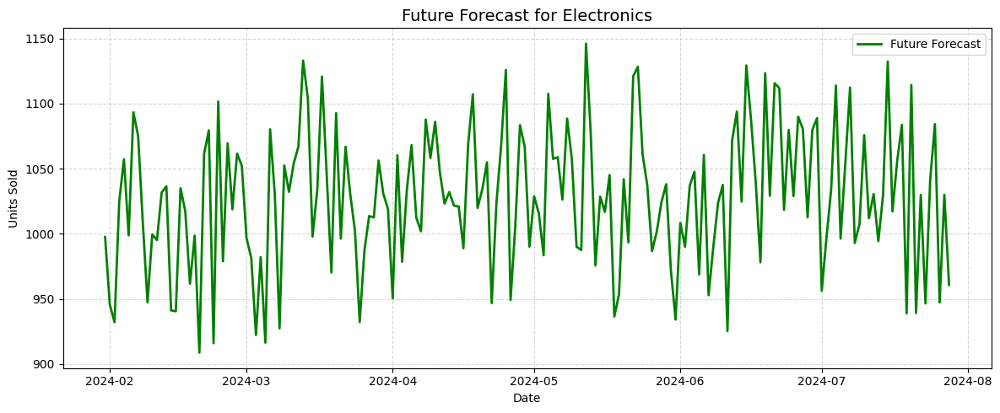

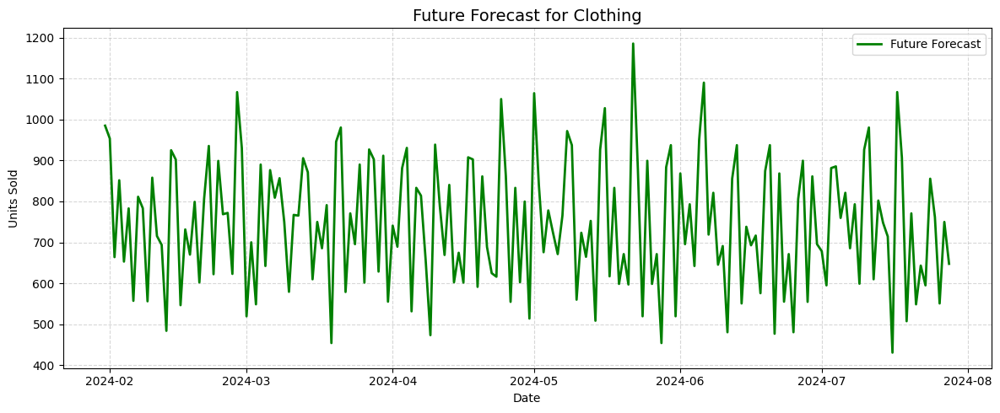

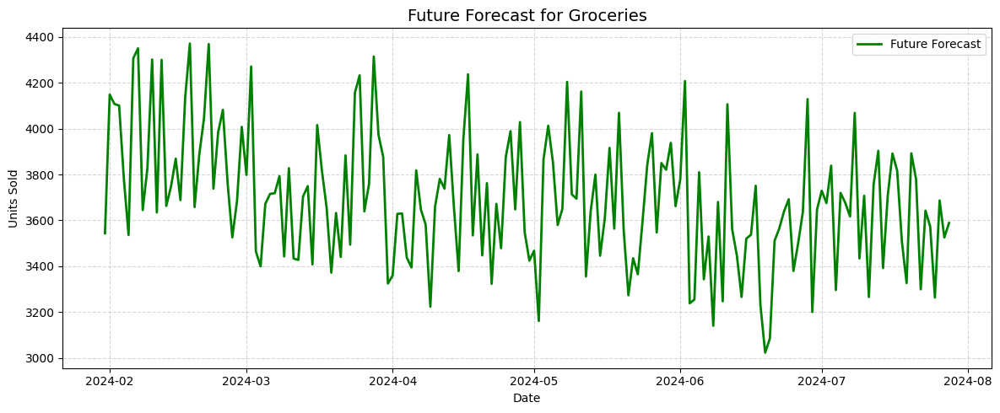

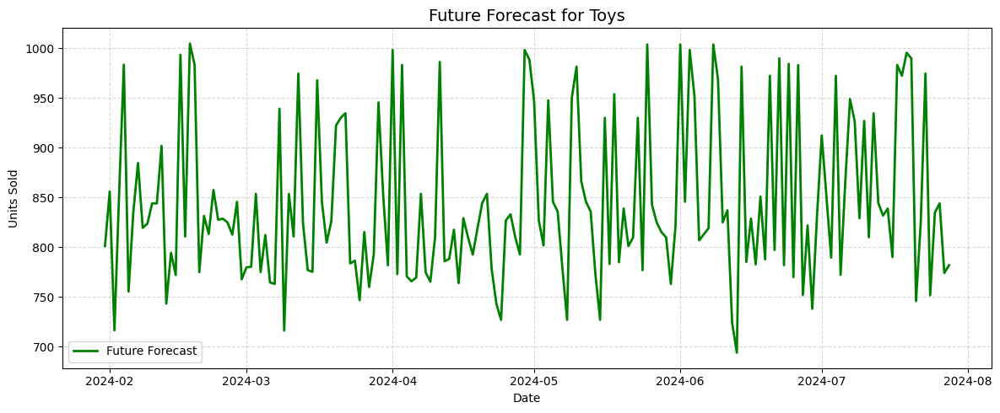

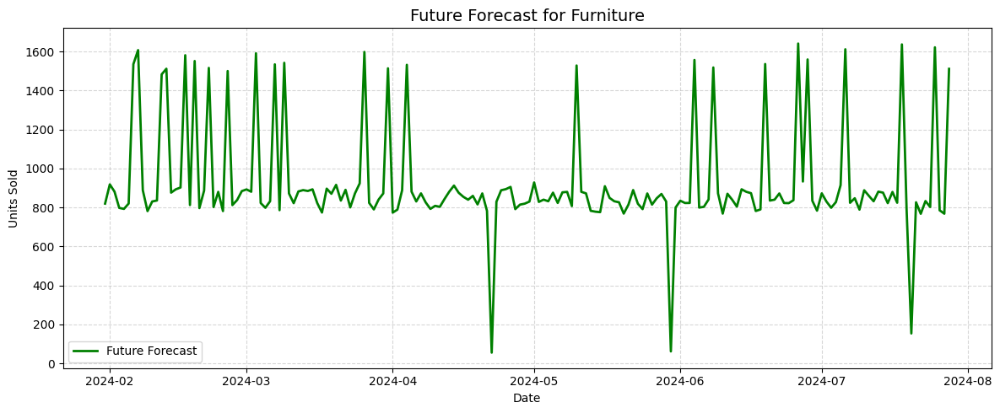

In [ ]:
def plot_future_forecast(data_dict, category):
    if category in data_dict:
        df = data_dict[category]
        plt.figure(figsize=(12, 5))
        plt.plot(df.index, df['forecast'], label='Future Forecast', color='green', linewidth=2)
        plt.title(f'Future Forecast for {category}', fontsize=14)
        plt.xlabel('Date')
        plt.ylabel('Units Sold')
        plt.legend()
        plt.grid(True, linestyle='--', alpha=0.5)
        plt.tight_layout()
        plt.show()
    else:
        print(f"Prediksi untuk kategori '{category}' tidak ditemukan.")

# Panggil fungsi untuk setiap kategori yang berhasil
for cat in forecast_future_dict.keys():
    plot_future_forecast(forecast_future_dict, cat)

Categories with forecast data: ['Electronics', 'Clothing', 'Groceries', 'Toys', 'Furniture']
Example data for Groceries:
               forecast
2024-01-31  3543.570950
2024-02-01  4147.986231
2024-02-02  4107.521084
2024-02-03  4100.324646
2024-02-04  3781.068917
2024-02-05  3536.280785
2024-02-06  4306.115072
2024-02-07  4349.744160
2024-02-08  3644.924895
2024-02-09  3828.194091
2024-02-10  4301.331317
2024-02-11  3634.428704
2024-02-12  4299.913147
2024-02-13  3662.829367
2024-02-14  3747.467502
2024-02-15  3869.056639
2024-02-16  3688.332100
2024-02-17  4132.638746
2024-02-18  4370.666294
2024-02-19  3657.993802
2024-02-20  3887.087163
2024-02-21  4045.729764
2024-02-22  4368.796097
2024-02-23  3738.197188
2024-02-24  3984.048131
2024-02-25  4081.827449
2024-02-26  3764.167195
2024-02-27  3525.833180
2024-02-28  3684.471191
2024-02-29  4007.562195
2024-03-01  3798.032806
2024-03-02  4270.808864
2024-03-03  3464.476063
2024-03-04  3399.767217
2024-03-05  3671.965290
2024-03-06  371

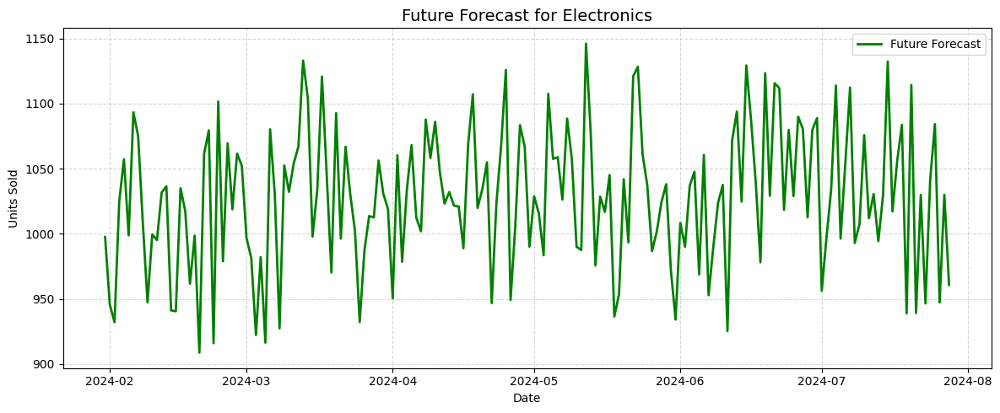

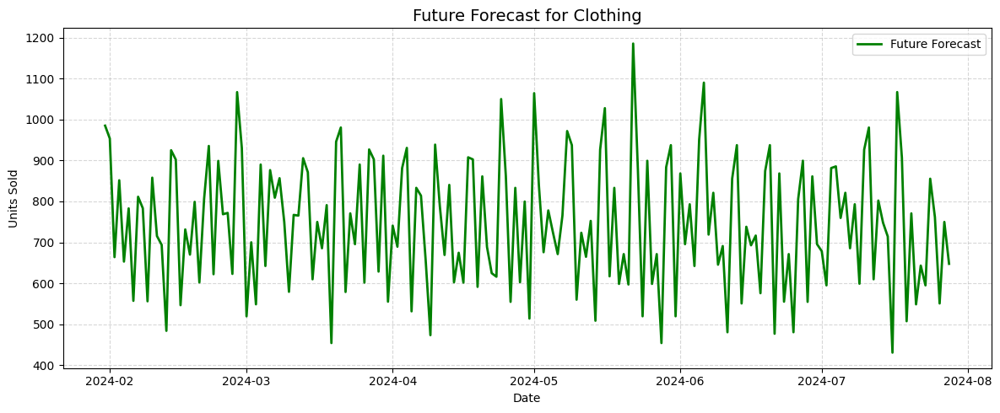

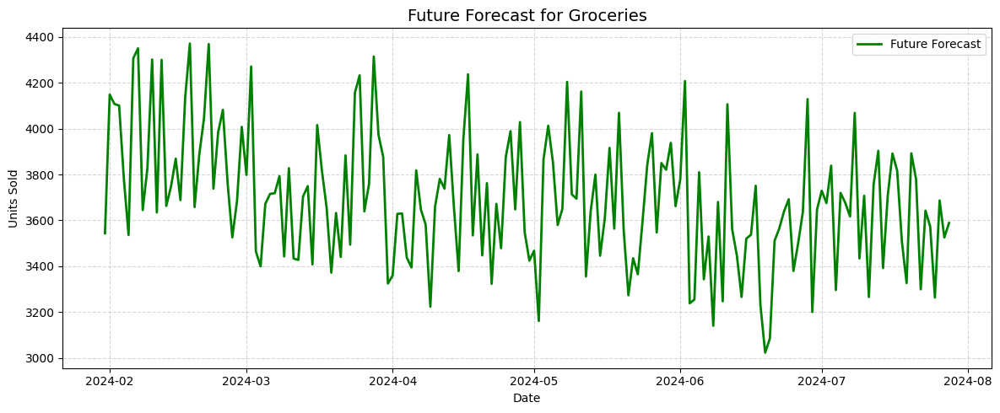

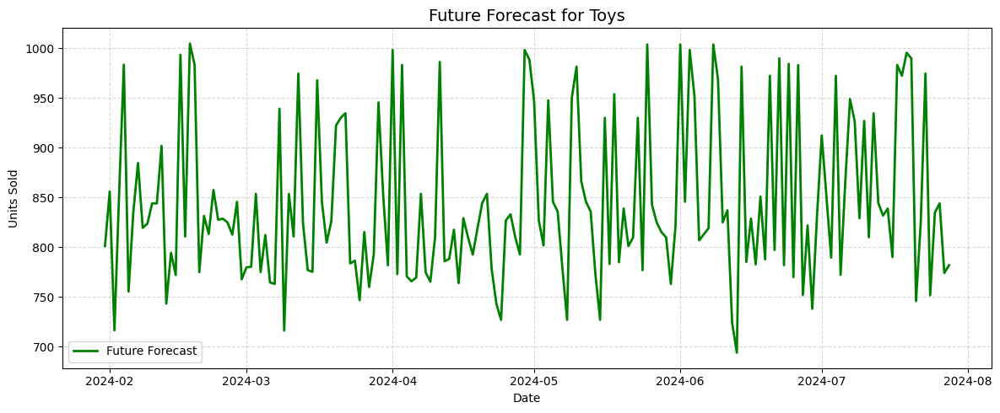

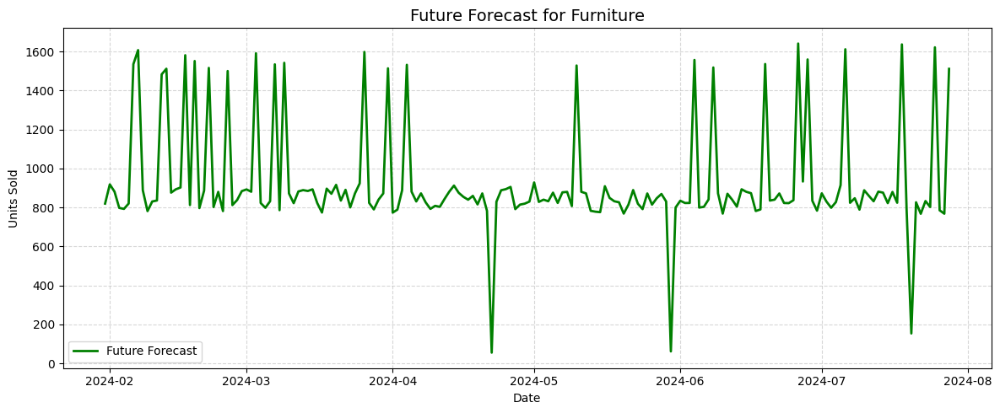

In [ ]:
# Check the contents of the dictionary
print(f"Categories with forecast data: {list(forecast_future_dict.keys())}")
print(f"Example data for Groceries:\n{forecast_future_dict.get('Groceries')}")

# Panggil fungsi untuk setiap kategori yang berhasil
for cat in forecast_future_dict.keys():
    plot_future_forecast(forecast_future_dict, cat)

In [ ]:
print("\n--- Hasil Prediksi untuk Masa Depan ---")
for cat, df in forecast_future_dict.items():
    print(f"\nKategori: {cat}")
    print(df.head())
    print("...")
    print(df.tail())


--- Hasil Prediksi untuk Masa Depan ---

Kategori: Electronics
               forecast
2024-01-31   997.532289
2024-02-01   945.480711
2024-02-02   932.079097
2024-02-03  1024.882016
2024-02-04  1057.215553
...
               forecast
2024-07-24  1041.452795
2024-07-25  1084.287755
2024-07-26   947.160750
2024-07-27  1029.879085
2024-07-28   960.722649

Kategori: Clothing
              forecast
2024-01-31  984.889410
2024-02-01  953.470789
2024-02-02  663.958905
2024-02-03  851.591233
2024-02-04  653.050083
...
              forecast
2024-07-24  855.397123
2024-07-25  761.680279
2024-07-26  550.857710
2024-07-27  749.870562
2024-07-28  647.646276

Kategori: Groceries
               forecast
2024-01-31  3543.570950
2024-02-01  4147.986231
2024-02-02  4107.521084
2024-02-03  4100.324646
2024-02-04  3781.068917
...
               forecast
2024-07-24  3573.256933
2024-07-25  3263.543749
2024-07-26  3686.813263
2024-07-27  3525.435023
2024-07-28  3588.767652

Kategori: Toys
              f

# Stock Optimalisasi

100%|██████████| 5/5 [00:00<00:00, 980.62it/s]

Electronics -> Optimalisasi stok berhasil. MAPE: 10.68%
Clothing -> Optimalisasi stok berhasil. MAPE: 8.47%
Groceries -> Optimalisasi stok berhasil. MAPE: 7.45%
Toys -> Optimalisasi stok berhasil. MAPE: 14.74%
Furniture -> Optimalisasi stok berhasil. MAPE: 7.84%
Hasil Optimalisasi Stok per Hari

Kategori: Electronics
               forecast  optimal_stock
2024-01-31   997.532289    1104.077085
2024-02-01   945.480711    1046.465963
2024-02-02   932.079097    1031.632945
2024-02-03  1024.882016    1134.347992
2024-02-04  1057.215553    1170.135022
---
               forecast  optimal_stock
2024-07-24  1041.452795    1152.688669
2024-07-25  1084.287755    1200.098761
2024-07-26   947.160750    1048.325444
2024-07-27  1029.879085    1139.878791
2024-07-28   960.722649    1063.335868

Kategori: Clothing
              forecast  optimal_stock
2024-01-31  984.889410    1068.338823
2024-02-01  953.470789    1034.258111
2024-02-02  663.958905     720.215964
2024-02-03  851.591233     923.746329

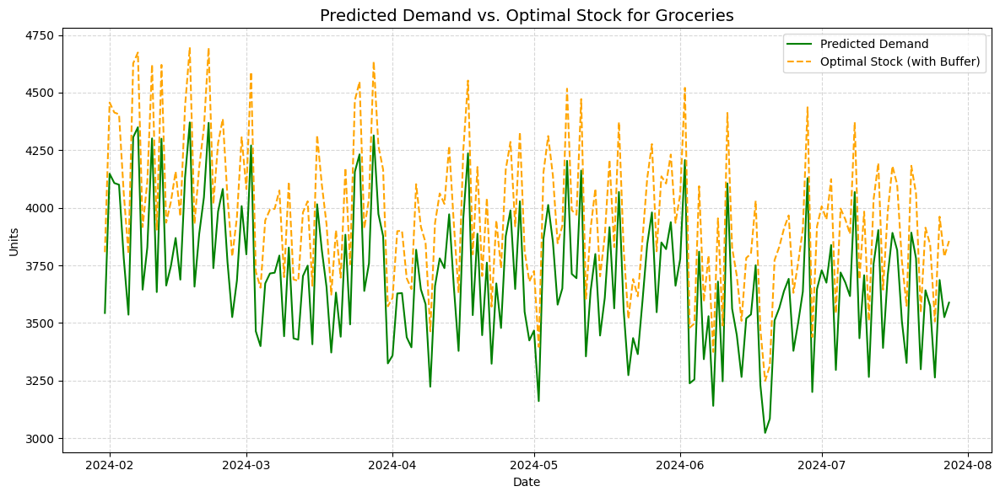

In [ ]:
stock_optimization_dict = {}
for cat, forecast_df in tqdm(forecast_future_dict.items()):
    if cat in eval_dict and 'MAPE_test' in eval_dict[cat]:
        mape_value = eval_dict[cat]['MAPE_test']

        # Hitung buffer berdasarkan MAPE
        forecast_df['stock_buffer'] = forecast_df['forecast'] * mape_value

        # Hitung stok optimal
        forecast_df['optimal_stock'] = forecast_df['forecast'] + forecast_df['stock_buffer']

        stock_optimization_dict[cat] = forecast_df
        print(f"{cat} -> Optimalisasi stok berhasil. MAPE: {mape_value:.2%}")
    else:
        # Pesan kesalahan yang lebih jelas
        print(f"Gagal mengoptimalkan stok untuk {cat} -> Tidak ada nilai MAPE_test yang ditemukan.")
        continue

print("Hasil Optimalisasi Stok per Hari")
for cat, df in stock_optimization_dict.items():
    print(f"\nKategori: {cat}")
    print(df[['forecast', 'optimal_stock']].head())
    print("---")
    print(df[['forecast', 'optimal_stock']].tail())

# Visualisasi Perbandingan Prediksi dan Stok Optimal
def plot_stock_optimization(data_dict, category):
    if category in data_dict:
        df = data_dict[category]
        plt.figure(figsize=(12, 6))
        plt.plot(df.index, df['forecast'], label='Predicted Demand', color='green')
        plt.plot(df.index, df['optimal_stock'], label='Optimal Stock (with Buffer)', color='orange', linestyle='--')
        plt.title(f'Predicted Demand vs. Optimal Stock for {category}', fontsize=14)
        plt.xlabel('Date')
        plt.ylabel('Units')
        plt.legend()
        plt.grid(True, linestyle='--', alpha=0.5)
        plt.tight_layout()
        plt.show()
    else:
        print(f"Error: Kategori '{category}' tidak ditemukan dalam dictionary hasil optimalisasi.")

print("Grafik Prediksi Demand vs. Stok Optimal")
plot_stock_optimization(stock_optimization_dict, 'Groceries')

In [ ]:
pip install compress-pickle

In [76]:
import pickle
import os
import compress_pickle as compickle

# Buat folder 'models'
if not os.path.exists('models'):
    os.makedirs('models')

# Simpan semua model dan preprocessor yang sudah dilatih
# ke dalam satu file pickle
with open('models/sarimax_final_models.pkl', 'wb') as f:
    pickle.dump(final_models, f)
print("Semua model SARIMAX dan preprocessor berhasil disimpan dalam satu file 'sarimax_final_models.pkl'.")

with open('models/eval_dict.pkl', 'wb') as f:
    pickle.dump(eval_dict, f)

with open('models/frequency_dict.pkl', 'wb') as f:
    pickle.dump(frequency_dict, f)
print("eval_dict berhasil disimpan.")

Semua model SARIMAX dan preprocessor berhasil disimpan dalam satu file 'sarimax_final_models.pkl'.
eval_dict berhasil disimpan.


In [ ]:
import sklearn
print(sklearn.__version__)

1.6.1
